# Projet d'analyse data : Ebrasil

## Mise en place

Import des librairies

In [209]:
import pandas as pd
import seaborn as sns
import numpy as np
import warnings 
import os
import time
from datetime import datetime
import sqlalchemy
from matplotlib import pyplot as plt

Définition des paramètres graphiques

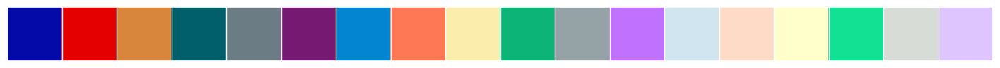

In [210]:
warnings.filterwarnings(action="ignore")

%matplotlib inline
if int(str(sns.__version__).split('.')[1]) > 8 : 
    plt.style.use('seaborn-v0_8-darkgrid')
else:
    plt.style.use('seaborn-darkgrid')
    
sns.set(font_scale=1)

palette = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", 
            "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#c071fe", 
            "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#dfc5fe", 
          ]
sns.palplot(sns.color_palette(palette))
plt.show()  

## Lecture du fichier de donées
Lecture des parquets créé en cours

In [211]:
ventes = pd.read_parquet("./donnees_traitees/analyse_ventes.parquet")
print("Colonnes disponibles dans le DataFrame ventes :")
print(ventes.columns.tolist())
ventes.info()
ventes.head()

Colonnes disponibles dans le DataFrame ventes :
['order_id', 'customer_id', 'purchase_timestamp', 'approved_at', 'delivered_carrier', 'delivered_customer', 'estimated_delivery', 'status', 'annee', 'mois', 'annee_mois', 'jour', 'annee_jour', 'jour_semaine', 'trimestre', 'annee_trimestre', 'semaine', 'annee_semaine', 'heure', 'approuvee', 'envoyee', 'livree', 'estimee', 'int_boleto', 'int_credit_card', 'int_debit_card', 'int_not_defined', 'int_voucher', 'value_boleto', 'value_credit_card', 'value_debit_card', 'value_not_defined', 'value_voucher', 'answer_1', 'answer_2', 'answer_3', 'answer_4', 'answer_5', 'comment_1', 'comment_2', 'comment_3', 'comment_4', 'comment_5', 'creation_1', 'creation_2', 'creation_3', 'creation_4', 'creation_5', 'score_1', 'score_2', 'score_3', 'score_4', 'score_5', 'score', 'answer', 'creation', 'comment', 'customer_unique_id', 'zip_code', 'city', 'state', 'name_state', 'lat_min', 'lat_max', 'lat', 'lng_min', 'lng_max', 'lng']
<class 'pandas.core.frame.DataFram

,order_id,customer_id,purchase_timestamp,approved_at,delivered_carrier,delivered_customer,estimated_delivery,status,annee,mois,...,zip_code,city,state,name_state,lat_min,lat_max,lat,lng_min,lng_max,lng
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,delivered,2017,10,...,3149,sao paulo,SP,São Paulo,-23.583885,-23.573954,-23.576983,-46.587473,-46.586194,-46.587161
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,delivered,2018,7,...,47813,barreiras,BA,Bahia,-12.945892,-12.117897,-12.177924,-45.016313,-38.456194,-44.660711
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,delivered,2018,8,...,75265,vianopolis,GO,Goiás,-16.752735,-16.740474,-16.745150,-48.522139,-48.500253,-48.514783
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,delivered,2017,11,...,59296,sao goncalo do amarante,RN,Rio Grande do Norte,-5.778488,-5.767733,-5.774190,-35.281450,-35.250465,-35.271143
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,delivered,2018,2,...,9195,santo andre,SP,São Paulo,-23.760018,-23.665996,-23.676370,-46.524784,-46.471974,-46.514627


In [212]:
print("\nAperçu des paiements par boleto:")
print(ventes[['int_boleto', 'value_boleto']].head(10))
print(ventes[['score', 'answer', 'creation', 'comment']])



Aperçu des paiements par boleto:
   int_boleto  value_boleto
0         0.0          0.00
1         1.0        141.46
2         0.0          0.00
3         0.0          0.00
4         0.0          0.00
5         0.0          0.00
6         0.0          0.00
7         0.0          0.00
8         1.0         35.95
9         0.0          0.00
       score  answer  creation  comment
0          1      27       205      170
1          1      18       339       20
2          1     115       231        3
3          1      67       340      105
4          1      37        74        3
...      ...     ...       ...      ...
99436      1      35       302        3
99437      1      41       539       44
99438      1      23       609       28
99439      1      33       410       53
99440      1      16       195        3

[99441 rows x 4 columns]


In [213]:
achats = pd.read_parquet("./donnees_traitees/analyse_achat.parquet")
print("Colonnes disponibles dans le DataFrame :")
print(achats.columns.tolist())
achats.info()
achats.head()

Colonnes disponibles dans le DataFrame :
['order_id', 'order_item_id', 'product_id', 'seller_id', 'price', 'freight_value', 'shipping_limit', 'limit', 'name_lenght', 'description_lenght', 'photos_qty', 'weight_g', 'length_cm', 'height_cm', 'width_cm', 'category_name', 'customer_id', 'purchase_timestamp', 'approved_at', 'delivered_carrier', 'delivered_customer', 'estimated_delivery', 'status', 'annee', 'mois', 'annee_mois', 'jour', 'annee_jour', 'jour_semaine', 'trimestre', 'annee_trimestre', 'semaine', 'annee_semaine', 'heure', 'approuvee', 'envoyee', 'livree', 'estimee', 'customer_unique_id', 'cust_zip_code', 'cust_city', 'cust_state', 'cust_name_state', 'cust_lat', 'cust_lng', 'sell_zip_code', 'sell_city', 'sell_state', 'sell_name_state', 'sell_lat', 'sell_lng']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 51 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         


,order_id,order_item_id,product_id,seller_id,price,freight_value,shipping_limit,limit,name_lenght,description_lenght,...,cust_state,cust_name_state,cust_lat,cust_lng,sell_zip_code,sell_city,sell_state,sell_name_state,sell_lat,sell_lng
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,2017-09-19 09:45:35,0.775833,58.0,598.0,...,RJ,Rio de Janeiro,-21.762775,-41.309633,27277,volta redonda,SP,São Paulo,-22.496953,-44.127492
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,2017-05-03 11:05:13,0.201944,56.0,239.0,...,SP,São Paulo,-20.220527,-50.903424,3471,sao paulo,SP,São Paulo,-23.565096,-46.518565
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,2018-01-18 14:48:30,0.249722,59.0,695.0,...,MG,Minas Gerais,-19.870305,-44.593326,37564,borda da mata,MG,Minas Gerais,-22.262584,-46.171124
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,2018-08-15 10:10:18,0.161944,42.0,480.0,...,SP,São Paulo,-23.089925,-46.611654,14403,franca,SP,São Paulo,-20.553624,-47.387359
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,2017-02-13 13:57:51,0.000000,59.0,409.0,...,SP,São Paulo,-23.243402,-46.827614,87900,loanda,PR,Paraná,-22.929384,-53.135873


In [214]:
def format_date(x):
    return pd.to_datetime(str(x), format='%Y%m').strftime('%d/%m/%Y')

# Analyse des ventes par dimensions

## Performance commerciale

### 1. Évolution du nombre de commandes par période en utilisant les colonnes temporelles

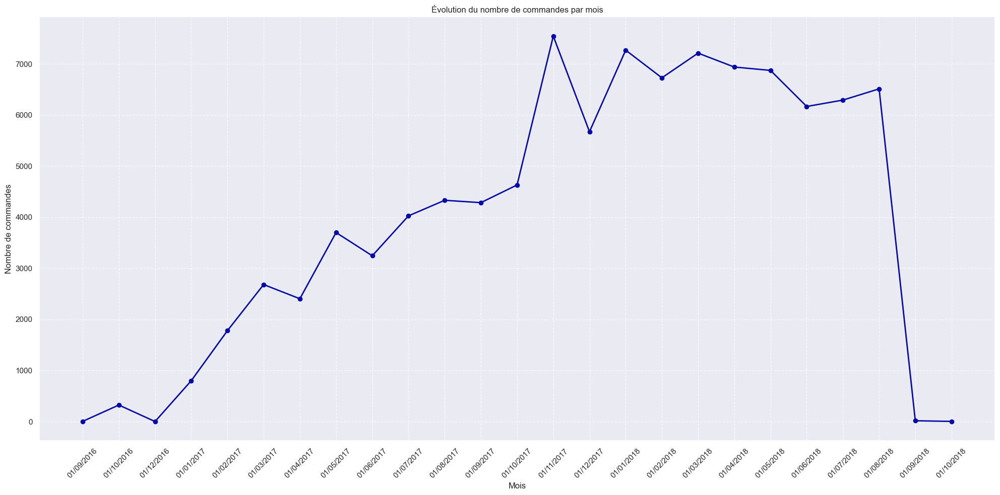

In [215]:
plt.figure(figsize=(20, 10))
monthly_orders = ventes.groupby('annee_mois').size()

plt.plot(range(len(monthly_orders)), monthly_orders.values, marker='o', linewidth=2, color=palette[0])
plt.title("Évolution du nombre de commandes par mois")
plt.xlabel("Mois")
plt.ylabel("Nombre de commandes")
plt.xticks(range(len(monthly_orders)), 
          [format_date(x) for x in monthly_orders.index], 
          rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 2. Analyse du panier moyen et de sa variation dans le temps

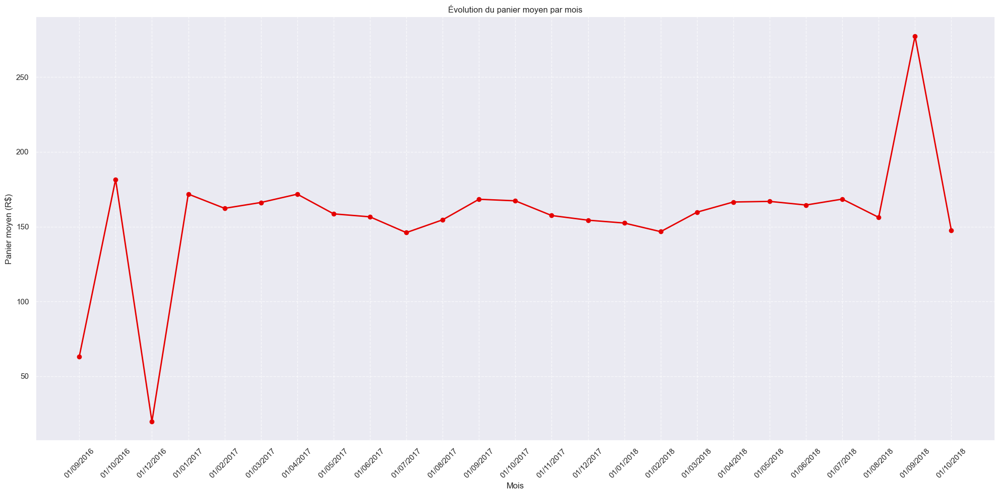

In [216]:
plt.figure(figsize=(20, 10))
monthly_basket = ventes.groupby('annee_mois')[['value_boleto', 'value_credit_card', 'value_debit_card', 
                                             'value_voucher', 'value_not_defined']].sum().sum(axis=1) / \
                ventes.groupby('annee_mois').size()

plt.plot(range(len(monthly_basket)), monthly_basket.values, marker='o', linewidth=2, color=palette[1])
plt.title("Évolution du panier moyen par mois")
plt.xlabel("Mois")
plt.ylabel("Panier moyen (R$)")
plt.xticks(range(len(monthly_orders)), 
          [format_date(x) for x in monthly_orders.index], 
          rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 3. Répartition des moyens de paiement par région

<Figure size 2000x1200 with 0 Axes>

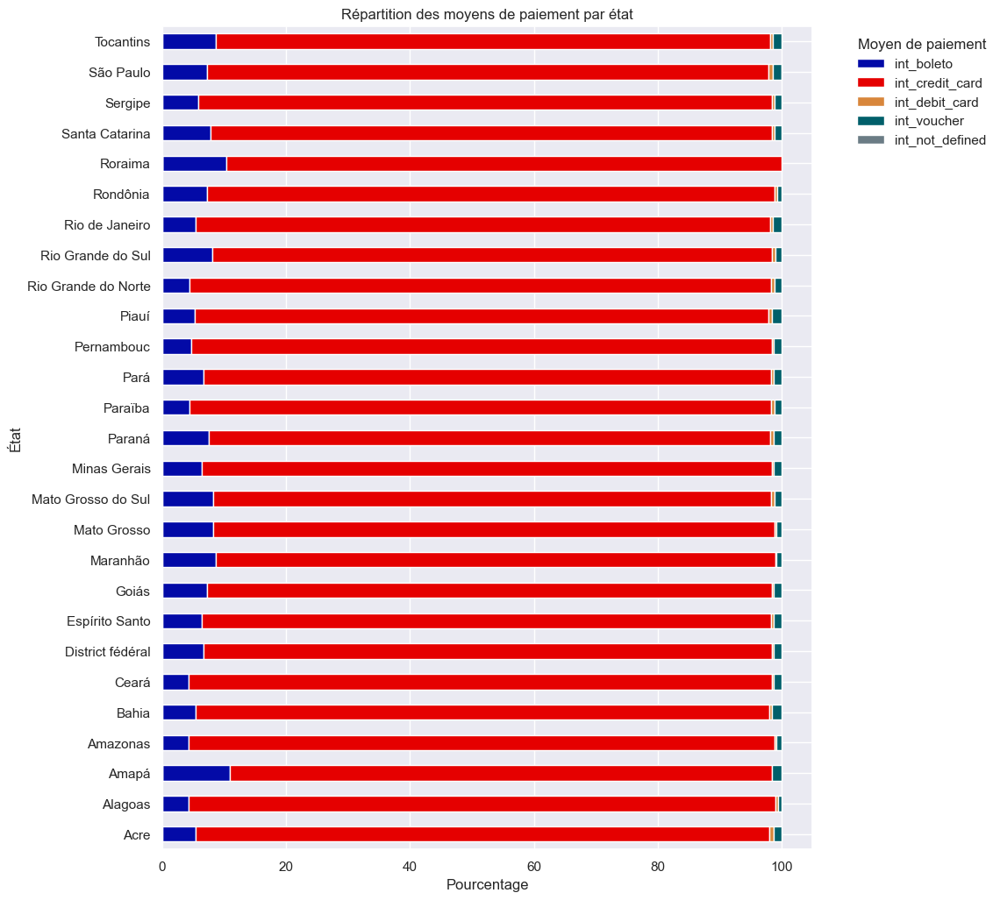

In [217]:
payment_by_state = ventes.groupby('name_state')[['int_boleto', 'int_credit_card', 'int_debit_card', 
                                                'int_voucher', 'int_not_defined']].sum()
payment_by_state_pct = payment_by_state.div(payment_by_state.sum(axis=1), axis=0) * 100

plt.figure(figsize=(20, 12))
payment_by_state_pct.plot(kind='barh', stacked=True, color=palette[:5])
plt.title("Répartition des moyens de paiement par état")
plt.ylabel("État")
plt.xlabel("Pourcentage")
plt.legend(title="Moyen de paiement", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.gcf().set_size_inches(20, 12)
plt.show()


### 4. Taux de conversion des commandes (ratio commandes approuvées/total)

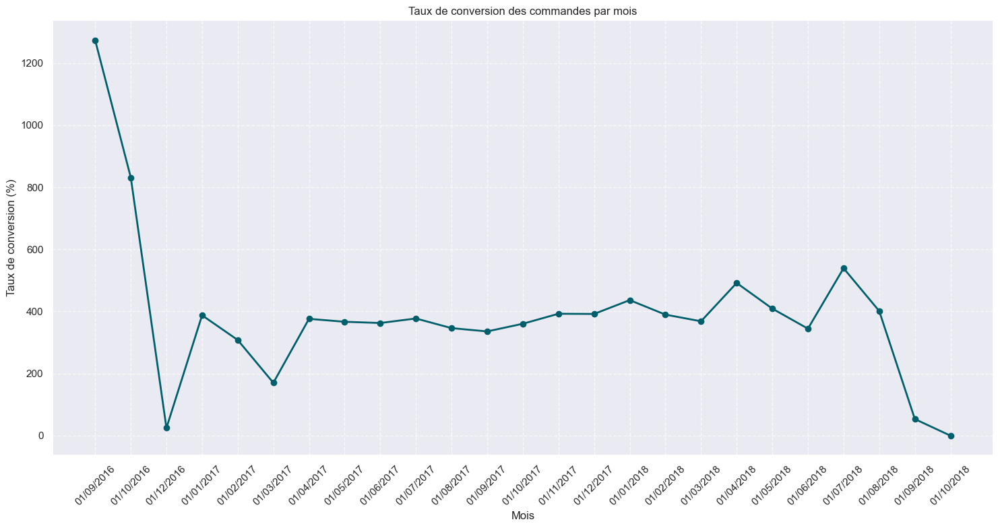

In [218]:
plt.figure(figsize=(15, 8))
conversion_rate = ventes.groupby('annee_mois').agg({
    'order_id': 'count',
    'approuvee': 'sum'
}).assign(taux_conversion=lambda x: (x['approuvee'] / x['order_id']) * 100)

plt.plot(range(len(conversion_rate)), conversion_rate['taux_conversion'], 
         marker='o', linewidth=2, color=palette[3])
plt.title("Taux de conversion des commandes par mois")
plt.xlabel("Mois")
plt.ylabel("Taux de conversion (%)")
plt.xticks(range(len(monthly_orders)), 
          [format_date(x) for x in monthly_orders.index], 
          rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 5. Analyse géographique des ventes par état/ville

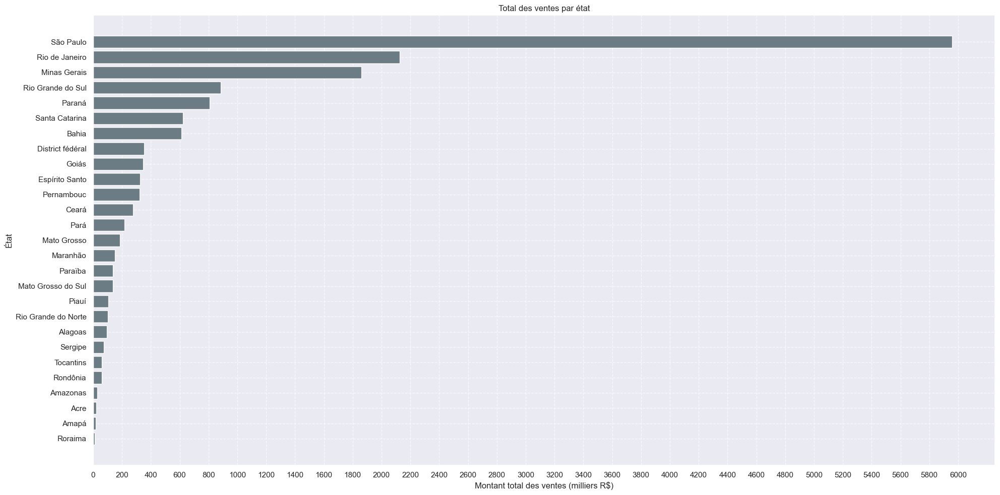

In [219]:
sales_by_state = ventes.groupby('name_state')[['value_boleto', 'value_credit_card', 'value_debit_card', 
                                              'value_voucher', 'value_not_defined']].sum().sum(axis=1)
sales_by_state = sales_by_state.sort_values(ascending=True)

plt.figure(figsize=(20, 10))
plt.barh(sales_by_state.index, sales_by_state.values / 1000, color=palette[4])
plt.title("Total des ventes par état")
plt.xlabel("Montant total des ventes (milliers R$)")
plt.ylabel("État")

max_value = (sales_by_state.values / 1000).max()
plt.xticks(np.arange(0, max_value + 200, 200))

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 6. Performance des ventes par créneau horaire

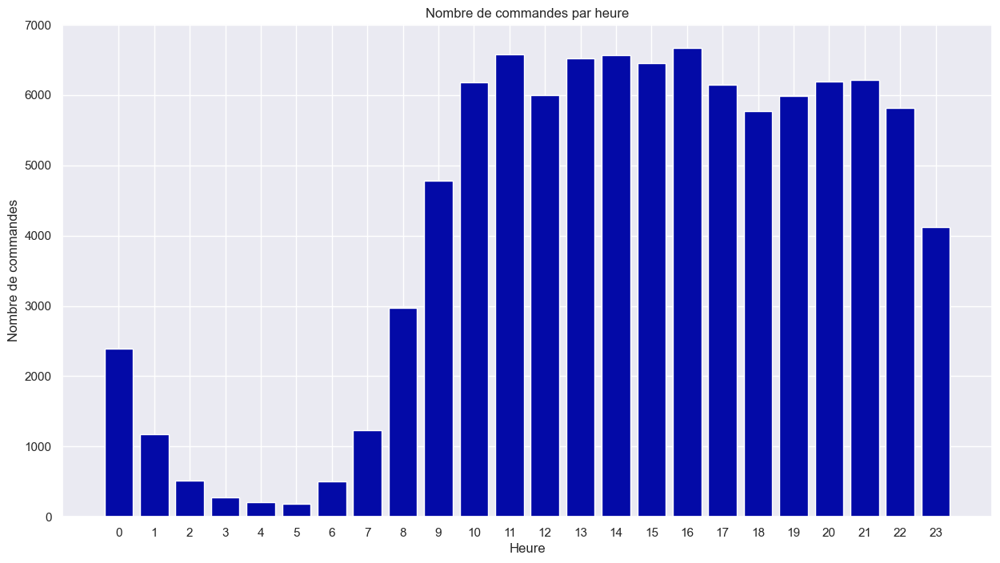

In [220]:
hourly_sales = ventes.groupby('heure').size()
    
plt.figure(figsize=(15, 8))
plt.bar(hourly_sales.index, hourly_sales.values, color=palette[0])
plt.title("Nombre de commandes par heure")
plt.xlabel("Heure")
plt.ylabel("Nombre de commandes")
plt.xticks(range(24))
plt.grid(True)
plt.show()

### 7. Analyse des pics de vente (top 10 des jours avec le plus de commandes)

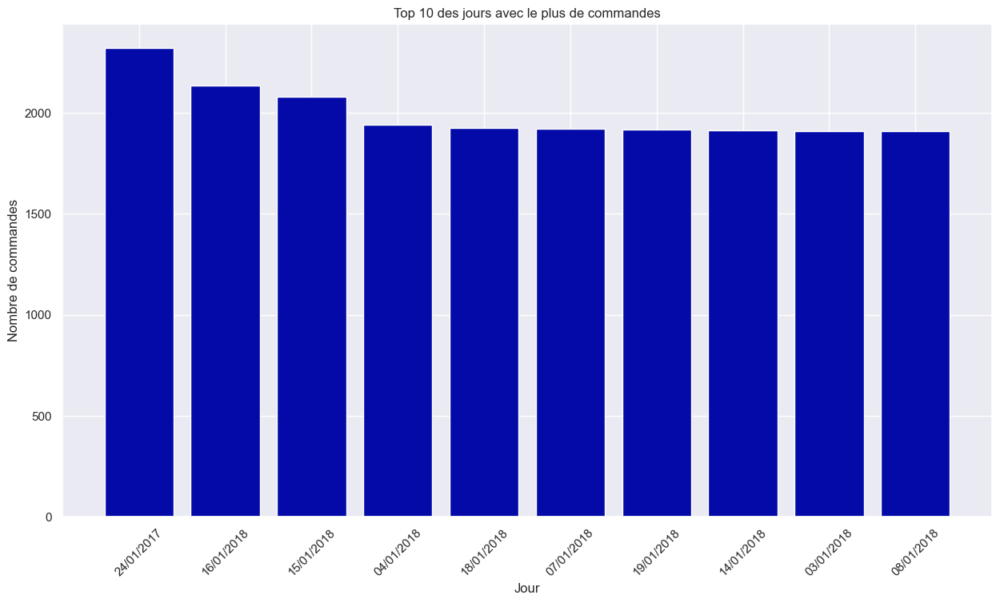

In [221]:
def format_date_daily(x):
    return pd.to_datetime(str(x), format='%Y%j').strftime('%d/%m/%Y')

daily_sales = ventes.groupby('annee_jour').size()
top_10_days = daily_sales.nlargest(10)
    
plt.figure(figsize=(15, 8))
plt.bar(range(len(top_10_days)), top_10_days.values, color=palette[0])
plt.title("Top 10 des jours avec le plus de commandes")
plt.xlabel("Jour")
plt.ylabel("Nombre de commandes")
plt.xticks(range(len(top_10_days)), 
          [format_date_daily(x) for x in top_10_days.index], 
          rotation=45)
plt.show()

### 8. Saisonnalité des ventes (analyse par jour de la semaine et mois)

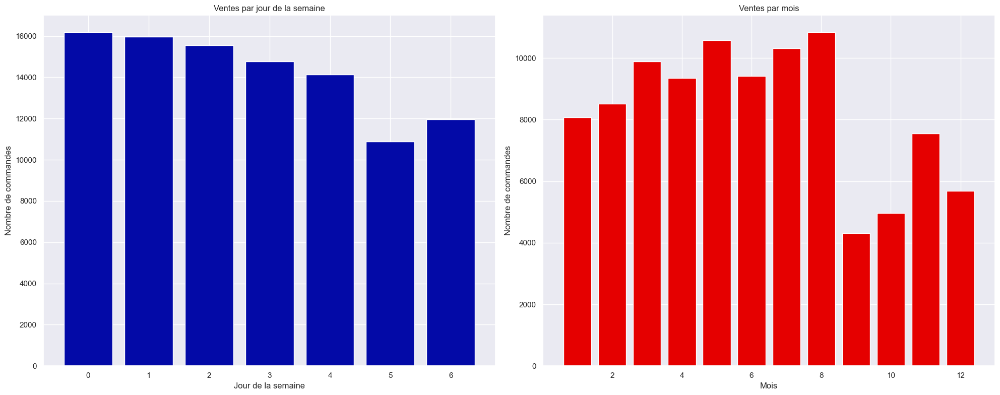

In [222]:
plt.figure(figsize=(20, 8))
    
plt.subplot(1, 2, 1)
weekday_sales = ventes.groupby('jour_semaine').size()
plt.bar(weekday_sales.index, weekday_sales.values, color=palette[0])
plt.title("Ventes par jour de la semaine")
plt.xlabel("Jour de la semaine")
plt.ylabel("Nombre de commandes")
    
plt.subplot(1, 2, 2)
monthly_sales = ventes.groupby('mois').size()
plt.bar(monthly_sales.index, monthly_sales.values, color=palette[1])
plt.title("Ventes par mois")
plt.xlabel("Mois")
plt.ylabel("Nombre de commandes")
    
plt.tight_layout()
plt.show()

### 9. Corrélation entre le montant des ventes et les frais de livraison

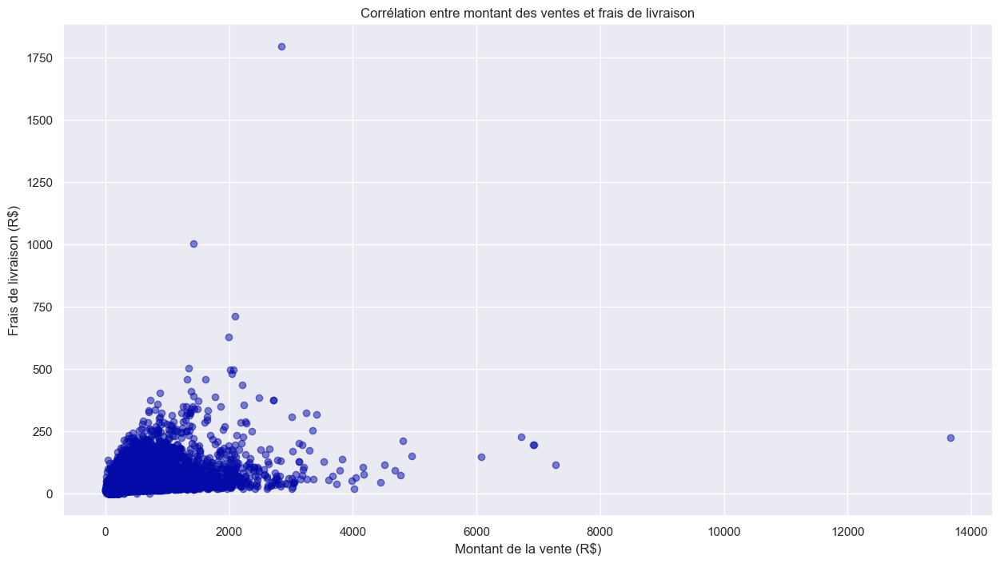

In [223]:
total_values = ventes[['value_boleto', 'value_credit_card', 'value_debit_card', 
                      'value_voucher', 'value_not_defined']].sum(axis=1)

freight_by_order = achats.groupby('order_id')['freight_value'].sum()

analysis_df = pd.DataFrame({
    'total_value': total_values,
    'freight_value': ventes['order_id'].map(freight_by_order)
})
    
plt.figure(figsize=(15, 8))
plt.scatter(analysis_df['total_value'], 
           analysis_df['freight_value'], 
           alpha=0.5, 
           color=palette[0])
plt.title("Corrélation entre montant des ventes et frais de livraison") 
plt.xlabel("Montant de la vente (R$)")
plt.ylabel("Frais de livraison (R$)")
plt.show()

### 10. Taux de fidélisation client (clients avec commandes répétées)

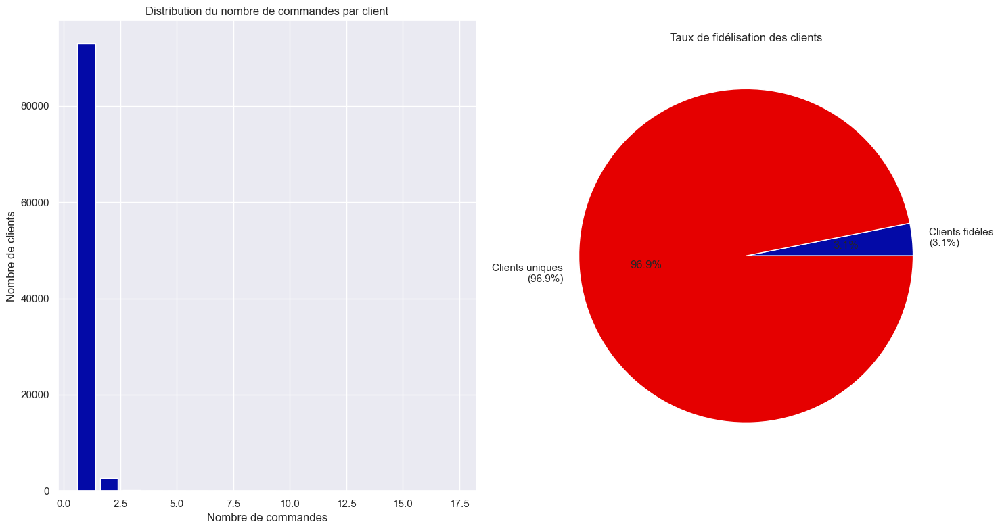

Nombre total de clients: 96096
Clients avec plus d'une commande: 2997 (3.1%)
Clients avec une seule commande: 93099 (96.9%)

Distribution détaillée:
                     Nombre de clients
Nombre de commandes                   
1                                93099
2                                 2745
3                                  203
4                                   30
5                                    8
6                                    6
7                                    3
9                                    1
17                                   1


In [224]:
customer_orders = ventes.groupby('customer_unique_id').size()

total_customers = len(customer_orders)
loyal_customers = len(customer_orders[customer_orders > 1])
one_time_customers = len(customer_orders[customer_orders == 1])

loyalty_rate = (loyal_customers / total_customers) * 100
one_time_rate = (one_time_customers / total_customers) * 100

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
loyalty_distribution = customer_orders.value_counts().sort_index()
plt.bar(loyalty_distribution.index, loyalty_distribution.values, color=palette[0])
plt.title("Distribution du nombre de commandes par client")
plt.xlabel("Nombre de commandes")
plt.ylabel("Nombre de clients")

plt.subplot(1, 2, 2)
plt.pie([loyal_customers, one_time_customers], 
        labels=[f'Clients fidèles\n({loyalty_rate:.1f}%)', 
                f'Clients uniques\n({one_time_rate:.1f}%)'],
        colors=[palette[0], palette[1]],
        autopct='%1.1f%%')
plt.title("Taux de fidélisation des clients")

plt.tight_layout()
plt.show()

print(f"Nombre total de clients: {total_customers}")
print(f"Clients avec plus d'une commande: {loyal_customers} ({loyalty_rate:.1f}%)")
print(f"Clients avec une seule commande: {one_time_customers} ({one_time_rate:.1f}%)")
print(f"\nDistribution détaillée:")
print(loyalty_distribution.to_frame('Nombre de clients').rename_axis('Nombre de commandes'))

## Satisfaction client

### 1. Score moyen de satisfaction global et son évolution temporelle

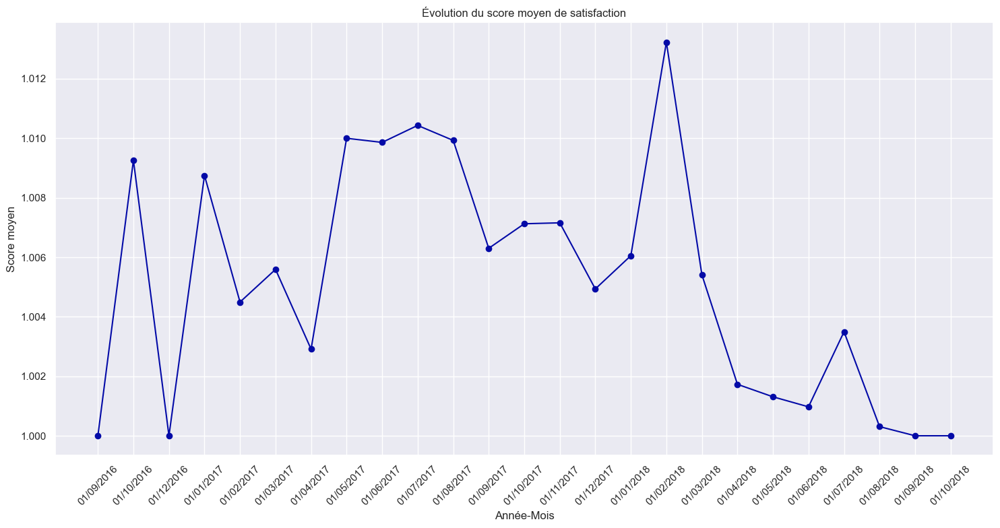

In [225]:
plt.figure(figsize=(15, 8))

monthly_satisfaction = ventes.groupby('annee_mois')['score'].mean()

plt.plot(range(len(monthly_satisfaction)), monthly_satisfaction.values, marker='o', color=palette[0])
plt.title("Évolution du score moyen de satisfaction")
plt.xlabel("Année-Mois")
plt.ylabel("Score moyen")
plt.grid(True)

plt.xticks(range(len(monthly_satisfaction)), 
          [format_date(x) for x in monthly_satisfaction.index], 
          rotation=45)

plt.tight_layout()
plt.show()

### 2. Analyse des commentaires par niveau de satisfaction

Nombre total de commentaires: 99441

Distribution des commentaires:
Score 1: 98886 commentaires (99.4%)
Score 2: 551 commentaires (0.6%)
Score 3: 4 commentaires (0.0%)


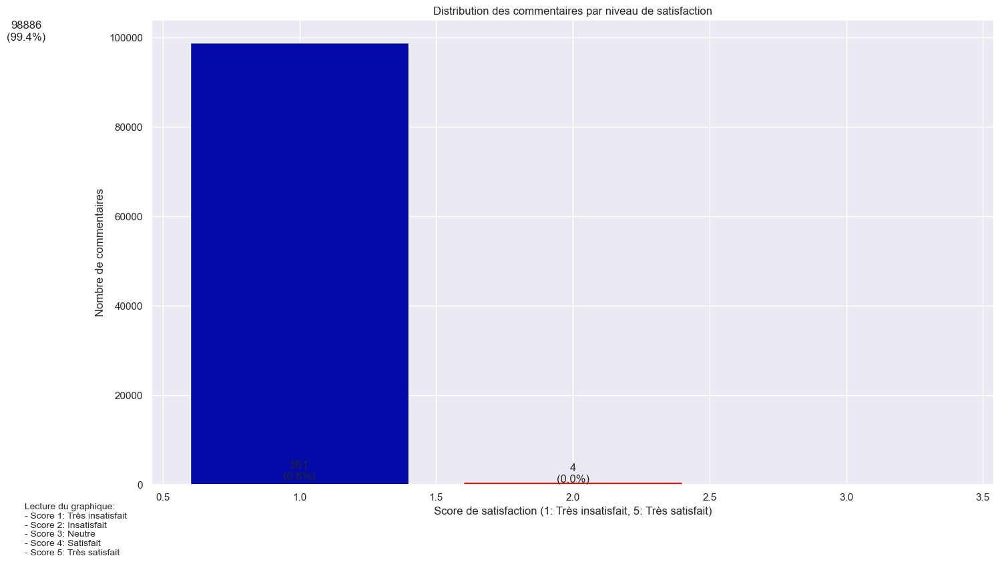

In [226]:
plt.figure(figsize=(15, 8))

comment_by_score = ventes.groupby('score')['comment'].count()
total_comments = comment_by_score.sum()

comment_percentages = (comment_by_score / total_comments * 100)

plt.bar(comment_by_score.index, comment_by_score.values, color=palette[0:len(comment_by_score)])

for i, v in enumerate(comment_by_score.values):
    plt.text(i, v, f'{v}\n({comment_percentages[i+1]:.1f}%)', 
             ha='center', va='bottom')

plt.title("Distribution des commentaires par niveau de satisfaction")
plt.xlabel("Score de satisfaction (1: Très insatisfait, 5: Très satisfait)")
plt.ylabel("Nombre de commentaires")

plt.figtext(0.02, -0.05, 
            "Lecture du graphique:\n" +
            "- Score 1: Très insatisfait\n" +
            "- Score 2: Insatisfait\n" +
            "- Score 3: Neutre\n" +
            "- Score 4: Satisfait\n" +
            "- Score 5: Très satisfait", 
            fontsize=10)

print(f"Nombre total de commentaires: {total_comments}")
print("\nDistribution des commentaires:")
for score in sorted(comment_by_score.index):
    print(f"Score {score}: {comment_by_score[score]} commentaires ({comment_percentages[score]:.1f}%)")

plt.tight_layout()
plt.show()

### 3. Corrélation entre le délai de livraison et la satisfaction client

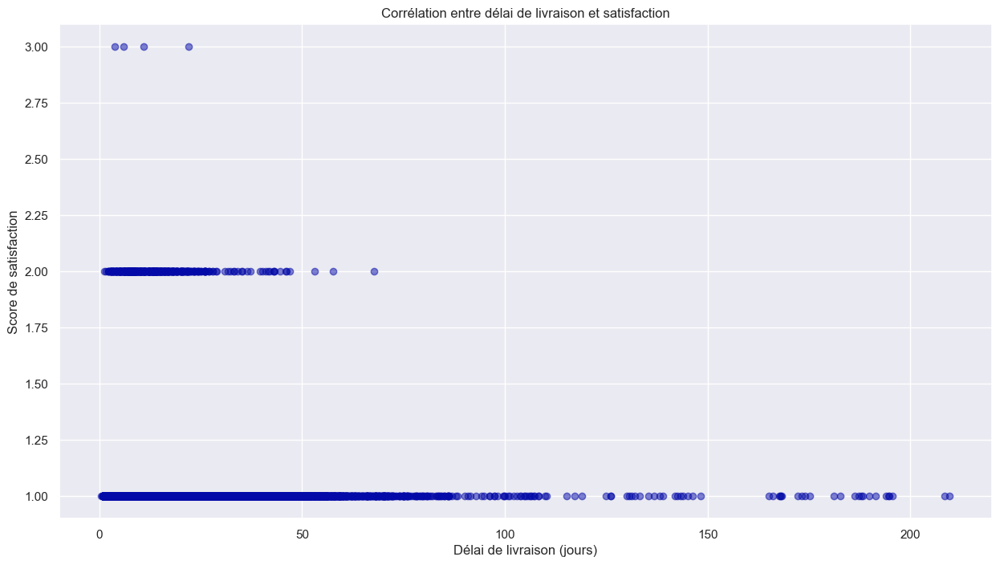

In [227]:
ventes['delai_livraison'] = (ventes['delivered_customer'] - ventes['purchase_timestamp']).dt.total_seconds() / (24*60*60)

plt.figure(figsize=(15, 8))
plt.scatter(ventes['delai_livraison'], ventes['score'], alpha=0.5, color=palette[0])
plt.title("Corrélation entre délai de livraison et satisfaction")
plt.xlabel("Délai de livraison (jours)")
plt.ylabel("Score de satisfaction")
plt.show()

### 4. Taux de réponse aux enquêtes de satisfaction

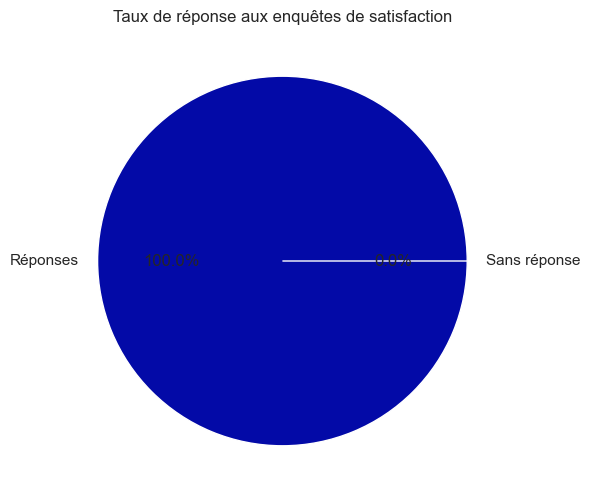

In [228]:
total_commandes = len(ventes)
commandes_avec_score = ventes['score'].notna().sum()
taux_reponse = (commandes_avec_score / total_commandes) * 100

plt.figure(figsize=(10, 6))
plt.pie([commandes_avec_score, total_commandes - commandes_avec_score], 
        labels=['Réponses', 'Sans réponse'],
        colors=[palette[0], palette[1]],
        autopct='%1.1f%%')
plt.title("Taux de réponse aux enquêtes de satisfaction")
plt.show()

### 5. Identification des zones géographiques avec les meilleurs/pires scores

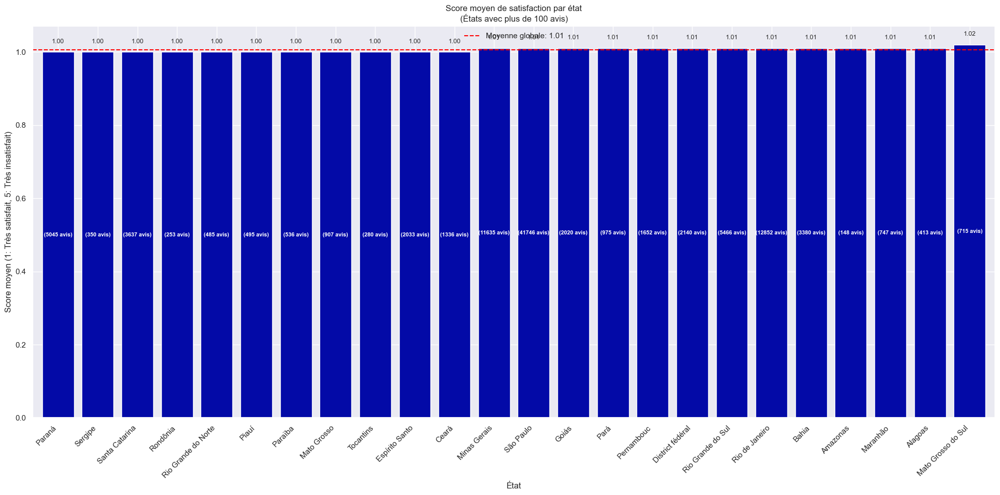

In [229]:
plt.figure(figsize=(20, 10))

state_stats = ventes.groupby('name_state').agg({
    'score': ['mean', 'count']
}).round(2)

min_reviews = 100
significant_states = state_stats[state_stats[('score', 'count')] >= min_reviews]

state_satisfaction = significant_states[('score', 'mean')].sort_values()

bars = plt.bar(range(len(state_satisfaction)), state_satisfaction.values, color=palette[0])

for i, v in enumerate(state_satisfaction.values):
    reviews = significant_states[('score', 'count')][state_satisfaction.index[i]]
    plt.text(i, v + 0.02, f'{v:.2f}', 
             ha='center', va='bottom', fontsize=9)
    plt.text(i, v/2, f'({reviews} avis)', 
             ha='center', va='center', fontsize=8, 
             color='white', fontweight='bold')

plt.title("Score moyen de satisfaction par état\n(États avec plus de 100 avis)")
plt.xlabel("État")
plt.ylabel("Score moyen (1: Très satisfait, 5: Très insatisfait)")

plt.xticks(range(len(state_satisfaction)), state_satisfaction.index, rotation=45, ha='right')

global_mean = ventes['score'].mean()
plt.axhline(y=global_mean, color='red', linestyle='--', 
            label=f'Moyenne globale: {global_mean:.2f}')
plt.legend()

plt.margins(x=0.01)
plt.tight_layout()
plt.show()

### 6. Impact du montant d'achat sur la satisfaction

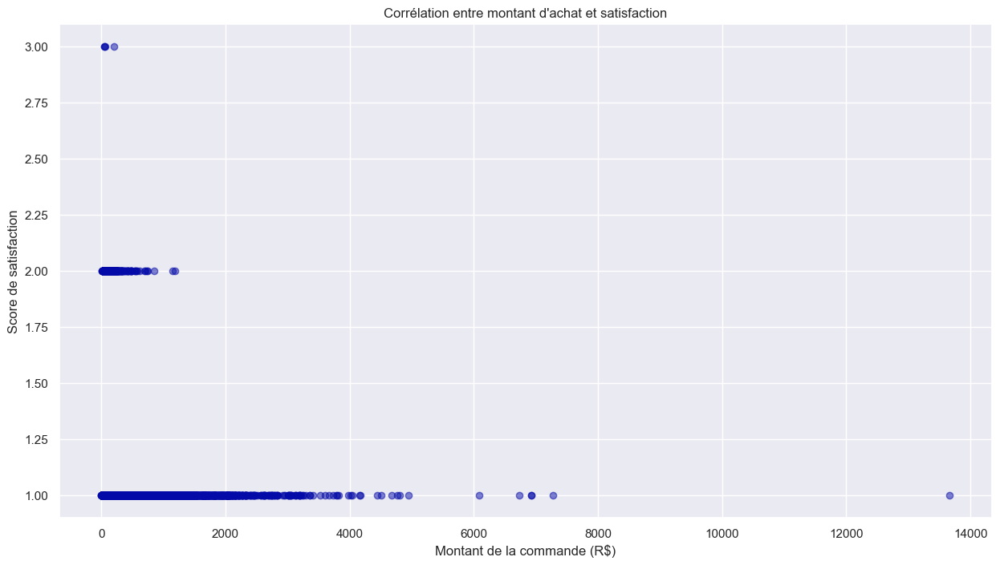

In [230]:
total_values = ventes[['value_boleto', 'value_credit_card', 'value_debit_card', 
                      'value_voucher', 'value_not_defined']].sum(axis=1)

plt.figure(figsize=(15, 8))
plt.scatter(total_values, ventes['score'], alpha=0.5, color=palette[0])
plt.title("Corrélation entre montant d'achat et satisfaction")
plt.xlabel("Montant de la commande (R$)")
plt.ylabel("Score de satisfaction")
plt.show()

### 7. Analyse des mots-clés dans les commentaires positifs/négatifs

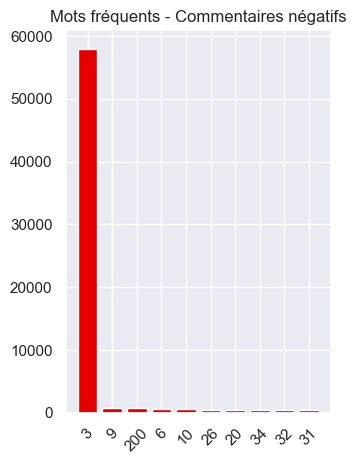

In [231]:
from collections import Counter
import re

commentaires_positifs = ' '.join(ventes[ventes['score'] >= 4]['comment'].astype(str).dropna())
commentaires_negatifs = ' '.join(ventes[ventes['score'] <= 2]['comment'].astype(str).dropna())

def get_top_words(text, n=10):
    words = re.findall(r'\w+', text.lower())
    return Counter(words).most_common(n)

plt.subplot(1, 2, 2)
neg_words = get_top_words(commentaires_negatifs)
plt.bar([x[0] for x in neg_words], [x[1] for x in neg_words], color=palette[1])
plt.title("Mots fréquents - Commentaires négatifs")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### 8. Variation de la satisfaction selon le jour de la semaine

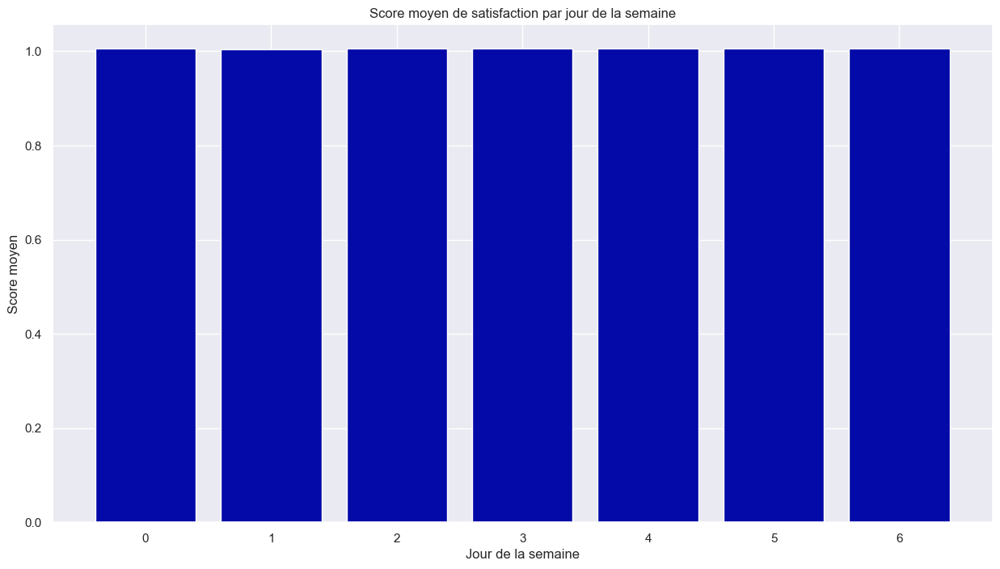

In [232]:
plt.figure(figsize=(15, 8))

satisfaction_jour = ventes.groupby('jour_semaine')['score'].mean()

plt.bar(satisfaction_jour.index, satisfaction_jour.values, color=palette[0])
plt.title("Score moyen de satisfaction par jour de la semaine")
plt.xlabel("Jour de la semaine")
plt.ylabel("Score moyen")
plt.show()

### 9. Corrélation entre le moyen de paiement et la satisfaction

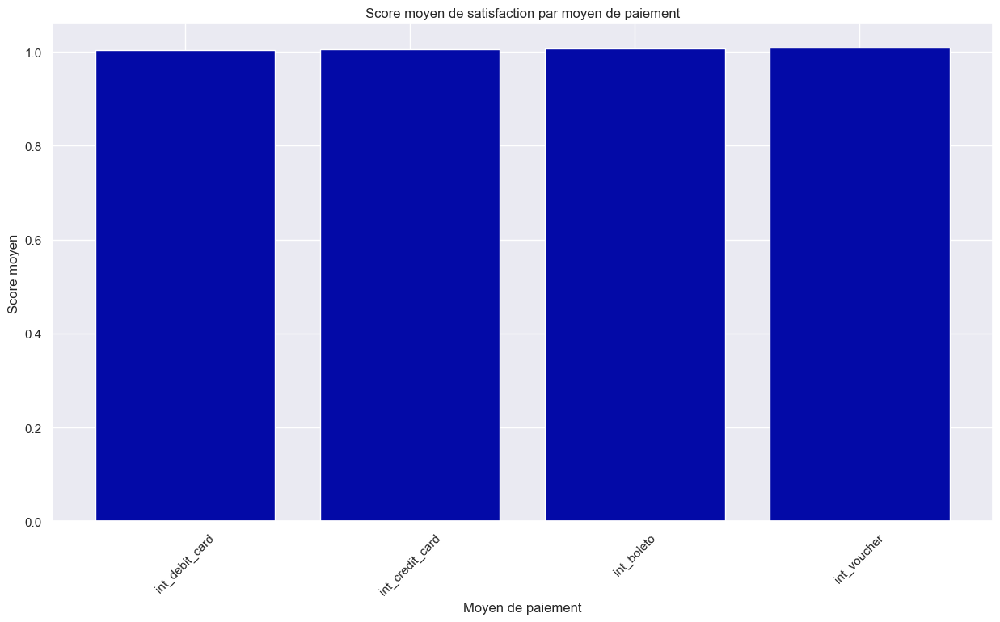

In [233]:
plt.figure(figsize=(15, 8))

payment_columns = ['int_boleto', 'int_credit_card', 'int_debit_card', 'int_voucher']
ventes['payment_method'] = ventes[payment_columns].idxmax(axis=1)

payment_satisfaction = ventes.groupby('payment_method')['score'].mean().sort_values()

plt.bar(payment_satisfaction.index, payment_satisfaction.values, color=palette[0])
plt.title("Score moyen de satisfaction par moyen de paiement")
plt.xlabel("Moyen de paiement")
plt.ylabel("Score moyen")
plt.xticks(rotation=45)
plt.show()

### 10. Impact du retard de livraison sur la satisfaction

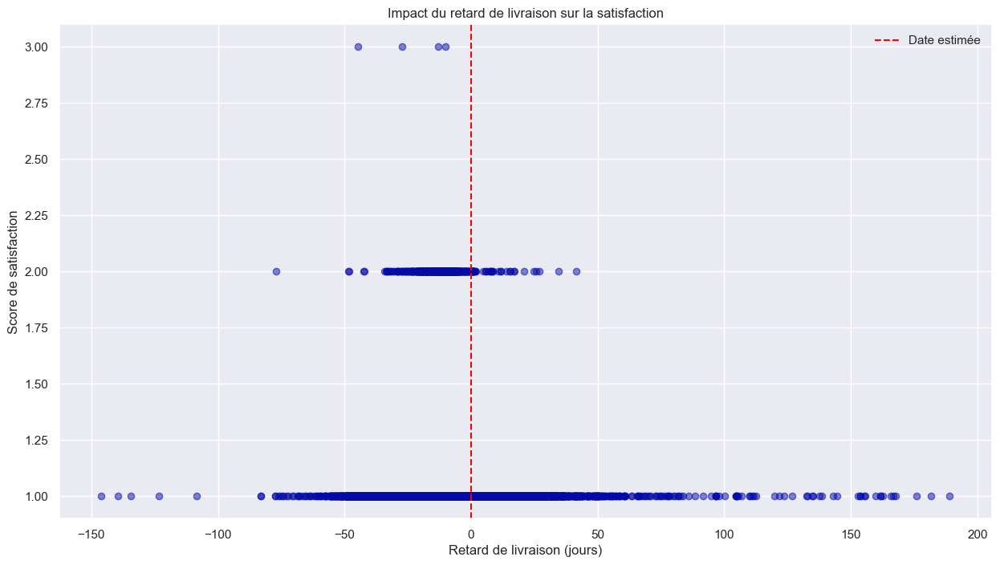

In [234]:
ventes['retard_livraison'] = (ventes['delivered_customer'] - ventes['estimated_delivery']).dt.total_seconds() / (24*60*60)

plt.figure(figsize=(15, 8))
plt.scatter(ventes['retard_livraison'], ventes['score'], alpha=0.5, color=palette[0])
plt.axvline(x=0, color='red', linestyle='--', label='Date estimée')
plt.title("Impact du retard de livraison sur la satisfaction")
plt.xlabel("Retard de livraison (jours)")
plt.ylabel("Score de satisfaction")
plt.legend()
plt.show()

## Qualité de service

### 1. Délai moyen entre la commande et la livraison par région

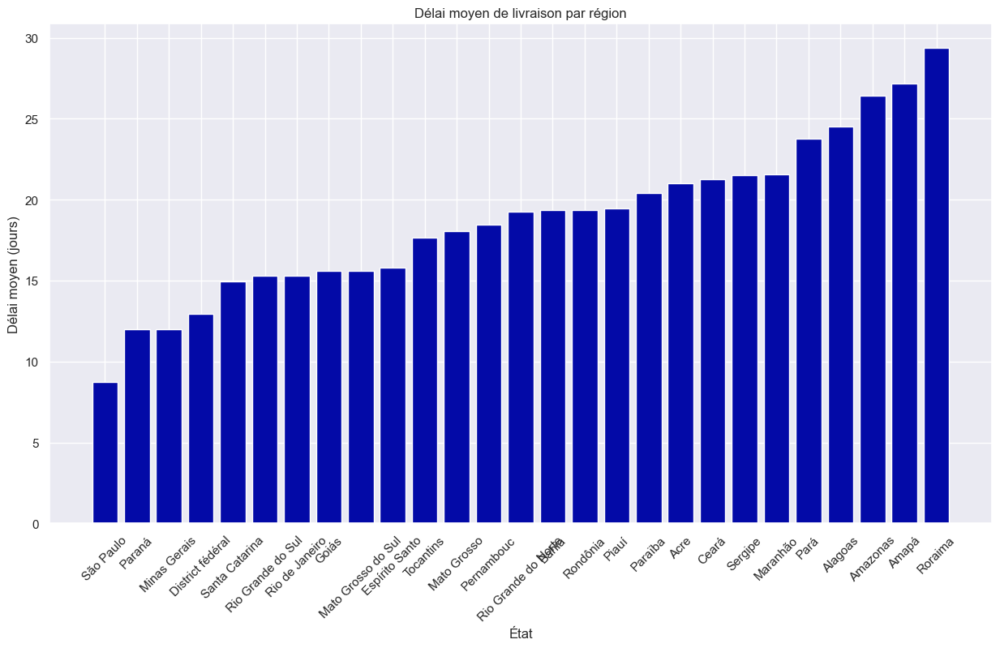

In [235]:
ventes['delai_livraison'] = (ventes['delivered_customer'] - ventes['purchase_timestamp']).dt.total_seconds() / (24*60*60)

plt.figure(figsize=(15, 8))
delai_region = ventes.groupby('name_state')['delai_livraison'].mean().sort_values()

plt.bar(delai_region.index, delai_region.values, color=palette[0])
plt.title("Délai moyen de livraison par région")
plt.xlabel("État")
plt.ylabel("Délai moyen (jours)")
plt.xticks(rotation=45)
plt.show()

### 2. Taux de respect des délais de livraison estimés

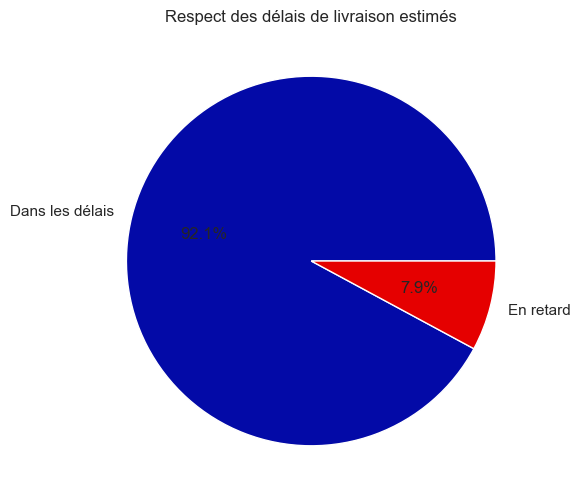

In [236]:
ventes['retard'] = ventes['delivered_customer'] > ventes['estimated_delivery']

plt.figure(figsize=(10, 6))
respect_delais = ventes['retard'].value_counts()
plt.pie(respect_delais.values, 
        labels=['Dans les délais', 'En retard'],
        colors=[palette[0], palette[1]],
        autopct='%1.1f%%')
plt.title("Respect des délais de livraison estimés")
plt.show()

### 3. Écart entre la date de livraison estimée et réelle

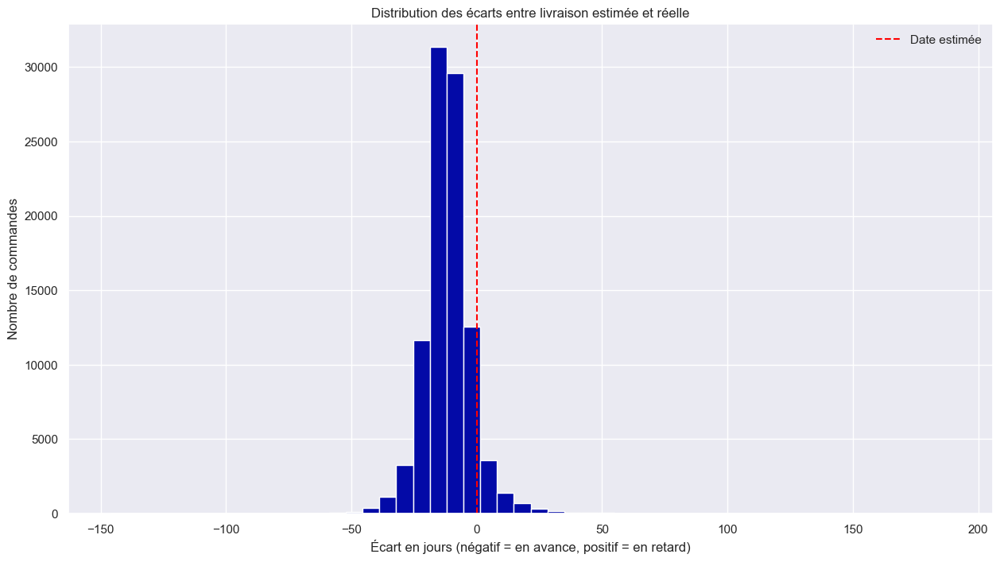

In [237]:
ventes['ecart_jours'] = (ventes['delivered_customer'] - ventes['estimated_delivery']).dt.total_seconds() / (24*60*60)

plt.figure(figsize=(15, 8))
plt.hist(ventes['ecart_jours'].dropna(), bins=50, color=palette[0])
plt.axvline(x=0, color='red', linestyle='--', label='Date estimée')
plt.title("Distribution des écarts entre livraison estimée et réelle")
plt.xlabel("Écart en jours (négatif = en avance, positif = en retard)")
plt.ylabel("Nombre de commandes")
plt.legend()
plt.show()

### 4. Respect des délais de livraison estimés par état

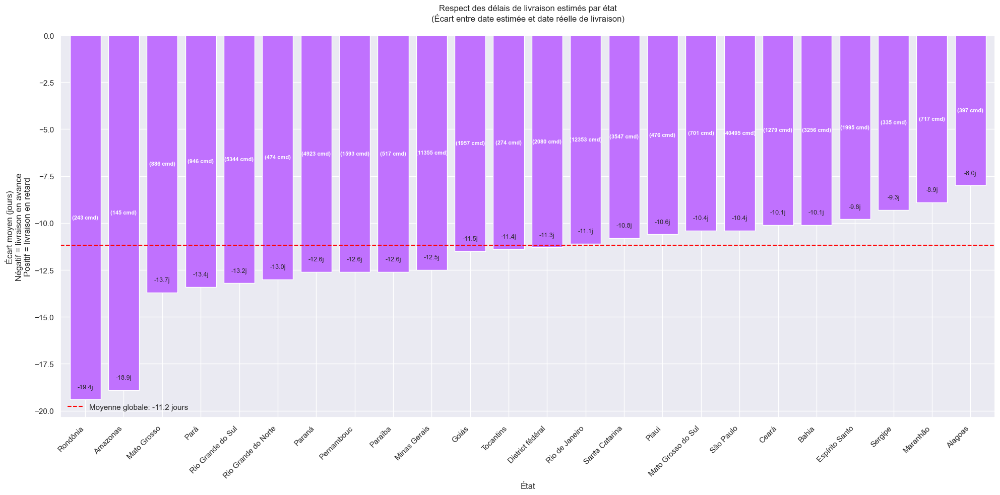

In [238]:
plt.figure(figsize=(20, 10))

ventes['ecart_livraison'] = (ventes['delivered_customer'] - ventes['estimated_delivery']).dt.total_seconds() / (24*60*60)

ecart_par_etat = ventes.groupby('name_state').agg({
    'ecart_livraison': ['mean', 'count']
}).round(1)

min_orders = 100
ecart_significatif = ecart_par_etat[ecart_par_etat[('ecart_livraison', 'count')] > min_orders]
ecart_significatif = ecart_significatif[('ecart_livraison', 'mean')].sort_values()

bars = plt.bar(range(len(ecart_significatif)), ecart_significatif.values, color='#c071fe')

for i, v in enumerate(ecart_significatif.values):
    orders = ecart_par_etat[('ecart_livraison', 'count')][ecart_significatif.index[i]]
    plt.text(i, v + 0.5, f'{v:.1f}j', ha='center', va='bottom', fontsize=9)
    plt.text(i, v/2, f'({orders} cmd)', ha='center', va='center', 
             color='white', fontweight='bold', fontsize=8)

plt.title("Respect des délais de livraison estimés par état\n" + 
          "(Écart entre date estimée et date réelle de livraison)",
          pad=20)
plt.xlabel("État")
plt.ylabel("Écart moyen (jours)\nNégatif = livraison en avance\nPositif = livraison en retard")

plt.xticks(range(len(ecart_significatif)), ecart_significatif.index, rotation=45, ha='right')

global_mean = ventes['ecart_livraison'].mean()
plt.axhline(y=global_mean, color='red', linestyle='--', 
            label=f'Moyenne globale: {global_mean:.1f} jours')
plt.legend()

plt.margins(x=0.01)
plt.tight_layout()
plt.show()

### 5. Analyse des retards par zone géographique

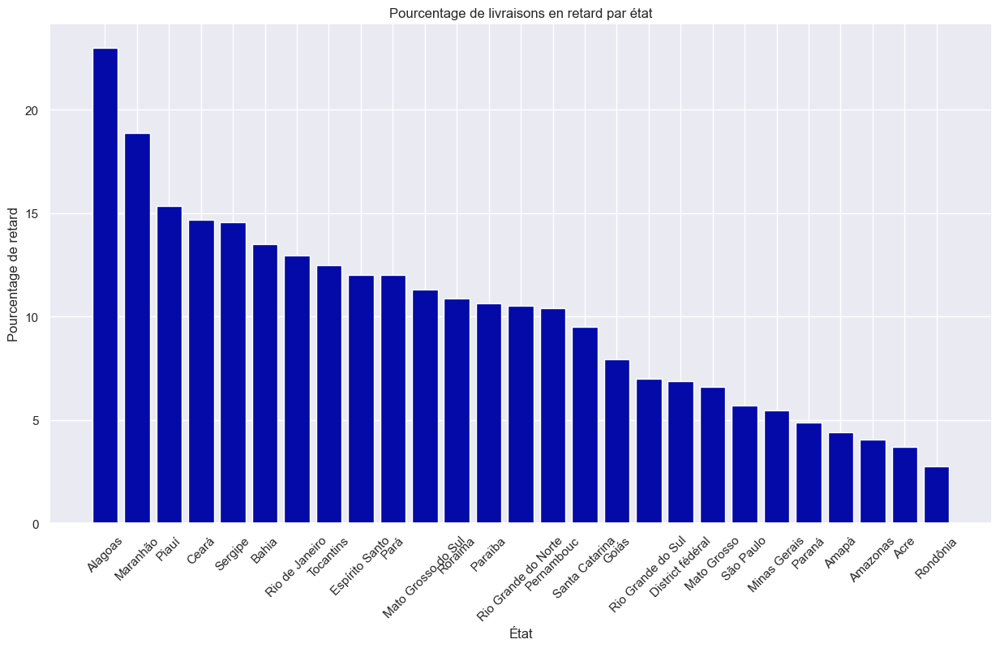

In [239]:
plt.figure(figsize=(15, 8))

retards_region = ventes.groupby('name_state')['retard'].mean() * 100
retards_region = retards_region.sort_values(ascending=False)

plt.bar(retards_region.index, retards_region.values, color=palette[0])
plt.title("Pourcentage de livraisons en retard par état")
plt.xlabel("État")
plt.ylabel("Pourcentage de retard")
plt.xticks(rotation=45)
plt.show()

### 6. Évolution des délais de livraison dans le temps

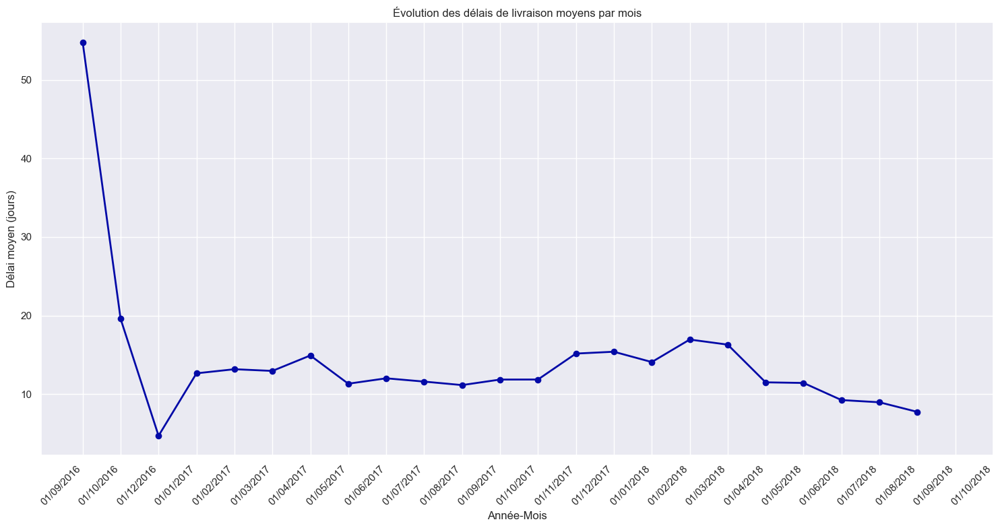

In [240]:
plt.figure(figsize=(15, 8))

ventes['delai_livraison'] = (ventes['delivered_customer'] - ventes['purchase_timestamp']).dt.total_seconds() / (24*60*60)

delai_mensuel = ventes.groupby('annee_mois')['delai_livraison'].mean()

plt.plot(range(len(delai_mensuel)), delai_mensuel.values, 
         marker='o', color=palette[0], linewidth=2)

plt.title("Évolution des délais de livraison moyens par mois")
plt.xlabel("Année-Mois")
plt.ylabel("Délai moyen (jours)")
plt.grid(True)

plt.xticks(range(len(delai_mensuel)), 
          [format_date(x) for x in delai_mensuel.index], 
          rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 7. Impact du jours de commande sur les délais de livraison

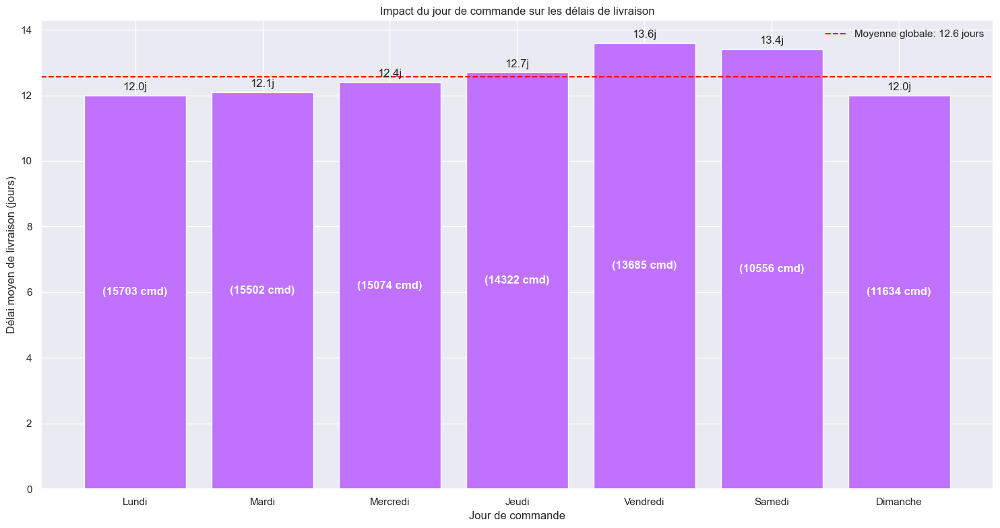


Statistiques par jour de commande:
Lundi: 12.0 jours (15703 commandes)
Mardi: 12.1 jours (15502 commandes)
Mercredi: 12.4 jours (15074 commandes)
Jeudi: 12.7 jours (14322 commandes)
Vendredi: 13.6 jours (13685 commandes)
Samedi: 13.4 jours (10556 commandes)
Dimanche: 12.0 jours (11634 commandes)


In [241]:
plt.figure(figsize=(15, 8))

ventes['delai_livraison'] = (ventes['delivered_customer'] - ventes['purchase_timestamp']).dt.total_seconds() / (24*60*60)

stats_jour = ventes.groupby('jour_semaine').agg({
    'delai_livraison': ['mean', 'count']
}).round(1)

jours = {
    0: 'Lundi',
    1: 'Mardi',
    2: 'Mercredi',
    3: 'Jeudi',
    4: 'Vendredi',
    5: 'Samedi',
    6: 'Dimanche'
}

bars = plt.bar(range(7), stats_jour[('delai_livraison', 'mean')], color='#c071fe')

for i, v in enumerate(stats_jour[('delai_livraison', 'mean')]):
    orders = stats_jour[('delai_livraison', 'count')][i]
    plt.text(i, v + 0.1, f'{v:.1f}j', ha='center', va='bottom')
    plt.text(i, v/2, f'({orders} cmd)', ha='center', va='center', 
             color='white', fontweight='bold')

plt.title("Impact du jour de commande sur les délais de livraison")
plt.xlabel("Jour de commande")
plt.ylabel("Délai moyen de livraison (jours)")

plt.xticks(range(7), [jours[i] for i in range(7)])

global_mean = ventes['delai_livraison'].mean()
plt.axhline(y=global_mean, color='red', linestyle='--', 
            label=f'Moyenne globale: {global_mean:.1f} jours')
plt.legend()

plt.tight_layout()
plt.show()

print("\nStatistiques par jour de commande:")
for i in range(7):
    print(f"{jours[i]}: {stats_jour[('delai_livraison', 'mean')][i]:.1f} jours "
          f"({stats_jour[('delai_livraison', 'count')][i]} commandes)")

### 8. Analyse des commandes avec des délais exceptionnellement longs

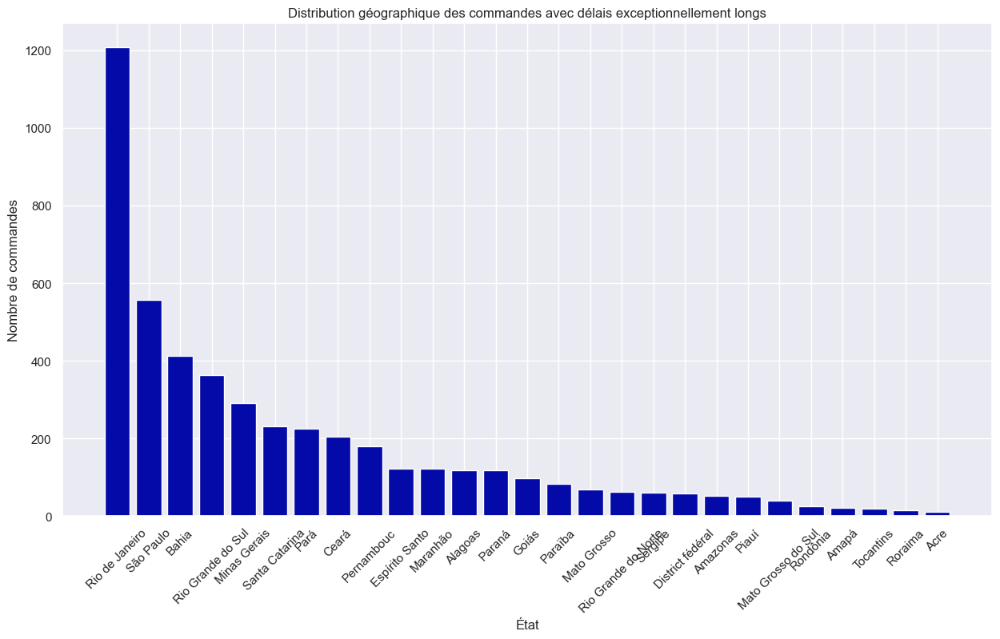

In [242]:
plt.figure(figsize=(15, 8))

seuil_long = ventes['delai_livraison'].quantile(0.95)
commandes_longues = ventes[ventes['delai_livraison'] > seuil_long]

etats_longs = commandes_longues['name_state'].value_counts()

plt.bar(etats_longs.index, etats_longs.values, color=palette[0])
plt.title("Distribution géographique des commandes avec délais exceptionnellement longs")
plt.xlabel("État")
plt.ylabel("Nombre de commandes")
plt.xticks(rotation=45)
plt.show()

### 9. Délais de livraison moyen par état 

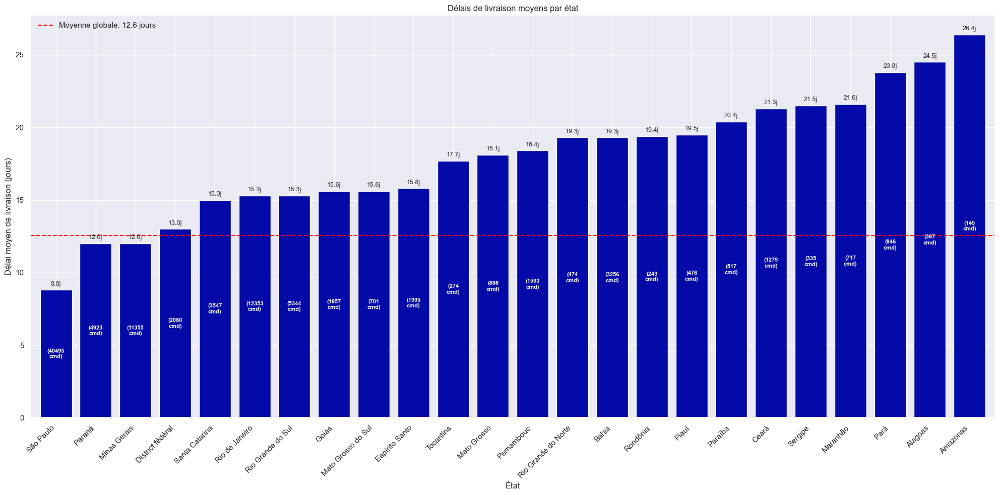

In [243]:
plt.figure(figsize=(20, 10))

ventes['delai_livraison'] = (ventes['delivered_customer'] - ventes['purchase_timestamp']).dt.total_seconds() / (24*60*60)

stats_state = ventes.groupby('name_state').agg({
    'delai_livraison': ['mean', 'count']
}).round(1)

min_orders = 100
stats_filtered = stats_state[stats_state[('delai_livraison', 'count')] > min_orders]
stats_filtered = stats_filtered.sort_values(('delai_livraison', 'mean'))

plt.bar(range(len(stats_filtered)), 
        stats_filtered[('delai_livraison', 'mean')], 
        color=palette[0],
        width=0.8)

for i, v in enumerate(stats_filtered[('delai_livraison', 'mean')]):
    orders = stats_filtered[('delai_livraison', 'count')][i]
    plt.text(i, v + 0.2, f'{v:.1f}j', 
             ha='center', va='bottom', 
             fontsize=9)
    plt.text(i, v/2, f'({orders}\ncmd)', 
             ha='center', va='center', 
             color='white', fontweight='bold', 
             fontsize=8)

plt.title("Délais de livraison moyens par état")
plt.xlabel("État")
plt.ylabel("Délai moyen de livraison (jours)")

plt.xticks(range(len(stats_filtered)), 
           stats_filtered.index, 
           rotation=45, 
           ha='right')

global_mean = ventes['delai_livraison'].mean()
plt.axhline(y=global_mean, color='red', linestyle='--', 
            label=f'Moyenne globale: {global_mean:.1f} jours')
plt.legend()

plt.margins(x=0.01)
plt.tight_layout()
plt.show()

### 10. Taux d'incidents de livraison par région

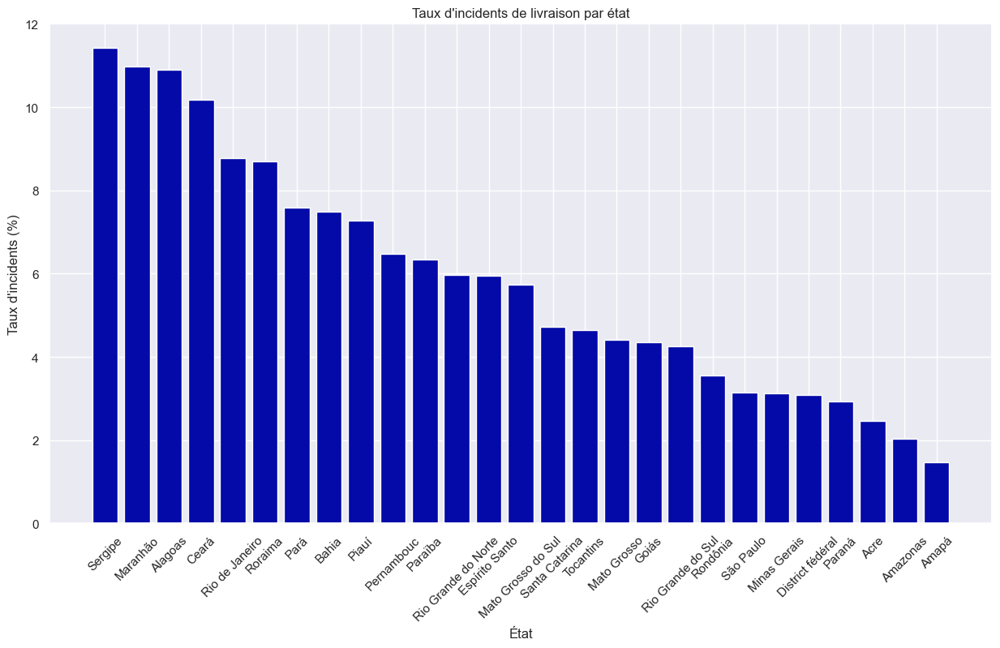

In [244]:
plt.figure(figsize=(15, 8))

ventes['incident'] = ((ventes['retard_livraison'] > 7) | 
                     (ventes['status'].isin(['canceled', 'unavailable'])))

incidents_region = ventes.groupby('name_state')['incident'].mean() * 100
incidents_region = incidents_region.sort_values(ascending=False)

plt.bar(incidents_region.index, incidents_region.values, color=palette[0])
plt.title("Taux d'incidents de livraison par état")
plt.xlabel("État")
plt.ylabel("Taux d'incidents (%)")
plt.xticks(rotation=45)
plt.show()

# Achats par dimension

## Performance fournisseurs

### 1. Nombre de commandes par vendeur et leur évolution

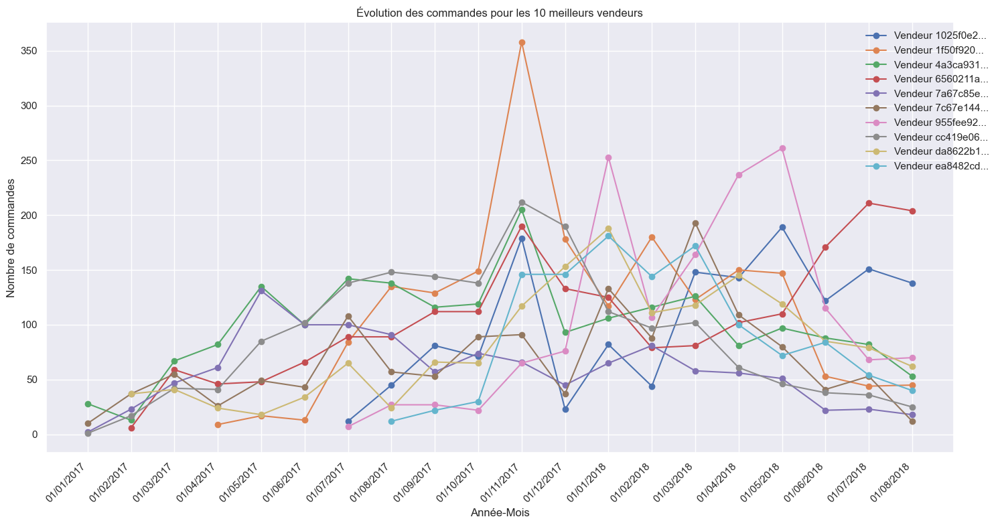

In [245]:
plt.figure(figsize=(15, 8))

top_sellers = achats.groupby('seller_id').size().nlargest(10).index

monthly_sales = achats[achats['seller_id'].isin(top_sellers)]\
    .groupby(['annee_mois', 'seller_id']).size().unstack()

for seller in monthly_sales.columns:
    plt.plot(range(len(monthly_sales)), monthly_sales[seller], 
             label=f'Vendeur {seller[:8]}...', marker='o')

plt.title("Évolution des commandes pour les 10 meilleurs vendeurs")
plt.xlabel("Année-Mois")
plt.ylabel("Nombre de commandes")

plt.xticks(range(len(monthly_sales)), 
          [format_date(x) for x in monthly_sales.index], 
          rotation=45, 
          ha='right')

plt.legend(bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

### 2. Délai moyen de traitement des commandes par vendeur

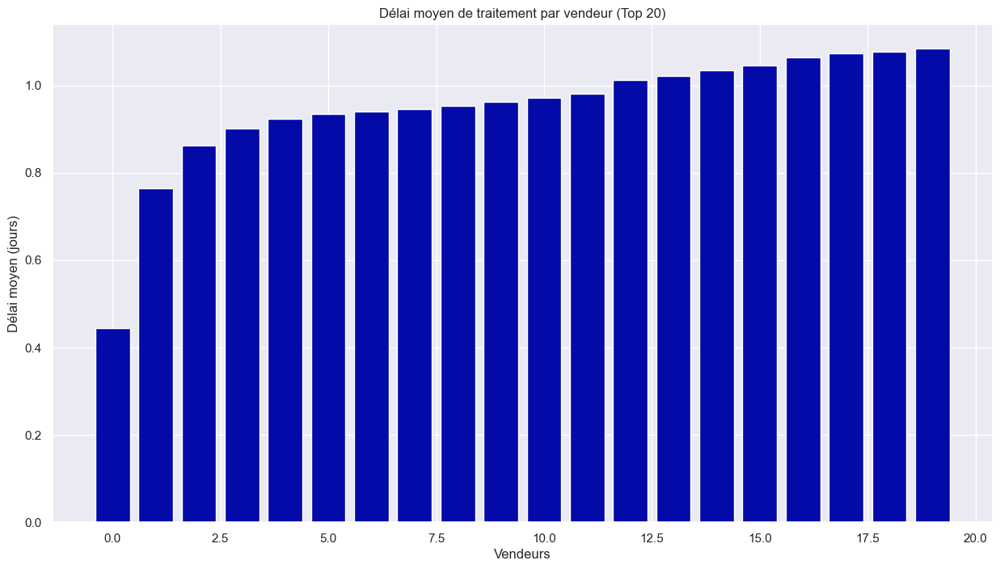

In [246]:
plt.figure(figsize=(15, 8))

achats['delai_traitement'] = (achats['delivered_carrier'] - achats['purchase_timestamp'])\
    .dt.total_seconds() / (24*60*60)

delai_vendeurs = achats.groupby('seller_id')['delai_traitement'].agg(['mean', 'count'])
delai_vendeurs = delai_vendeurs[delai_vendeurs['count'] > 10].sort_values('mean')[:20]

plt.bar(range(len(delai_vendeurs)), delai_vendeurs['mean'], color=palette[0])
plt.title("Délai moyen de traitement par vendeur (Top 20)")
plt.xlabel("Vendeurs")
plt.ylabel("Délai moyen (jours)")
plt.show()

### 3. Taux de respect des délais d'expédition

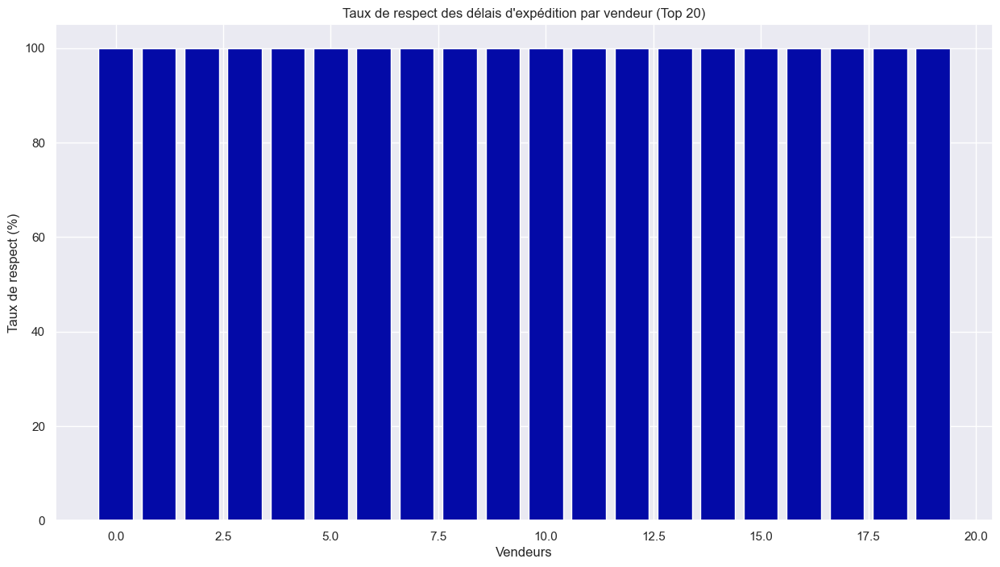

In [247]:
plt.figure(figsize=(15, 8))

achats['respect_delai'] = achats['delivered_carrier'] <= achats['shipping_limit']

respect_vendeurs = achats.groupby('seller_id').agg({
    'respect_delai': ['mean', 'count']
}).reset_index()
respect_vendeurs = respect_vendeurs[respect_vendeurs[('respect_delai', 'count')] > 10]
respect_vendeurs = respect_vendeurs.sort_values(('respect_delai', 'mean'), ascending=False)[:20]

plt.bar(range(len(respect_vendeurs)), 
        respect_vendeurs[('respect_delai', 'mean')] * 100, 
        color=palette[0])
plt.title("Taux de respect des délais d'expédition par vendeur (Top 20)")
plt.xlabel("Vendeurs")
plt.ylabel("Taux de respect (%)")
plt.show()

### 4. Répartition géographique des vendeurs

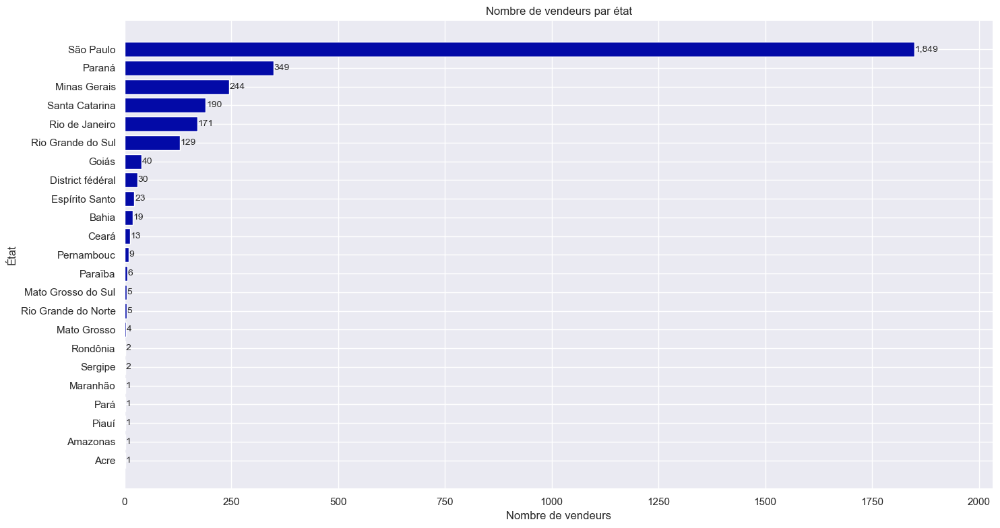

In [ ]:
plt.figure(figsize=(15, 8))

vendeurs_par_etat = achats.groupby('sell_name_state')['seller_id'].nunique()
vendeurs_par_etat = vendeurs_par_etat.sort_values(ascending=True)

bars = plt.barh(vendeurs_par_etat.index, vendeurs_par_etat.values, color=palette[0])

for i, v in enumerate(vendeurs_par_etat.values):
    plt.text(v + 1, i, f'{v:,}', 
             va='center', fontsize=10)

plt.title("Nombre de vendeurs par état")
plt.xlabel("Nombre de vendeurs")
plt.ylabel("État")

plt.margins(x=0.1)
plt.tight_layout()
plt.show()

### 5. Distance moyenne entre vendeur et client

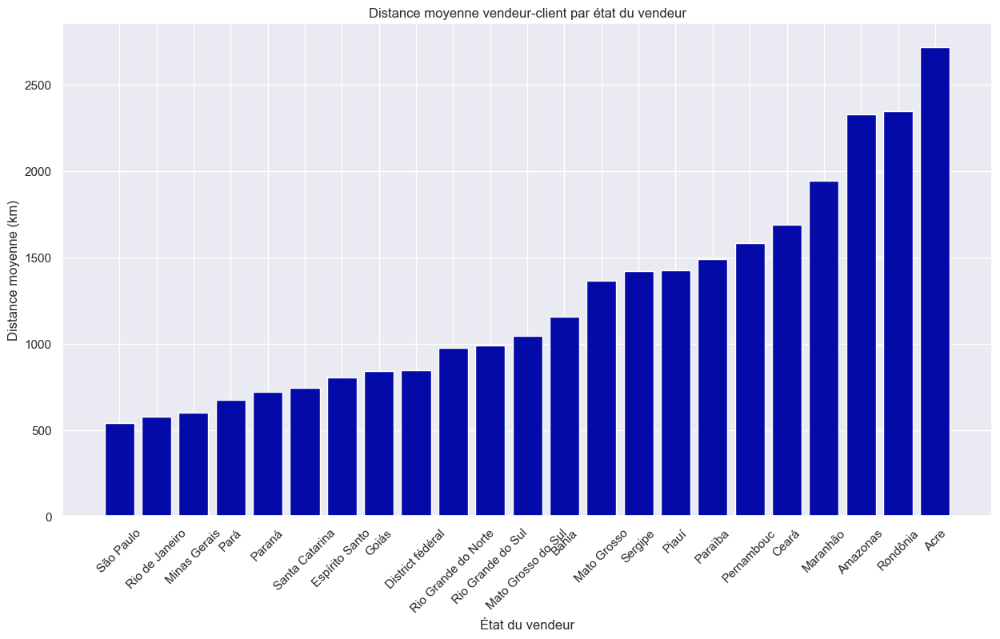

In [249]:
plt.figure(figsize=(15, 8))

def calculate_distance(row):
    R = 6371
    lat1, lon1 = radians(row['cust_lat']), radians(row['cust_lng'])
    lat2, lon2 = radians(row['sell_lat']), radians(row['sell_lng'])
    
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return R * c

achats['distance'] = achats.apply(calculate_distance, axis=1)

distance_moyenne = achats.groupby('sell_name_state')['distance'].mean().sort_values()

plt.bar(distance_moyenne.index, distance_moyenne.values, color=palette[0])
plt.title("Distance moyenne vendeur-client par état du vendeur")
plt.xlabel("État du vendeur")
plt.ylabel("Distance moyenne (km)")
plt.xticks(rotation=45)
plt.show()

### 6. Analyse du taux de satisfaction par vendeur

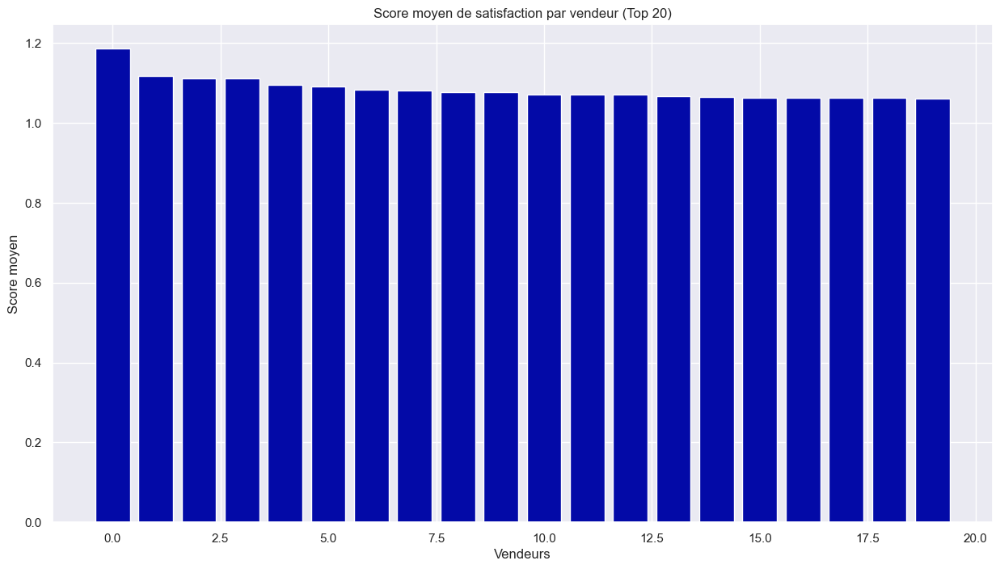

In [250]:
plt.figure(figsize=(15, 8))

achats_satisfaction = pd.merge(
    achats, 
    ventes[['order_id', 'score']], 
    on='order_id', 
    how='left'
)

satisfaction_vendeur = achats_satisfaction.groupby('seller_id').agg({
    'score': ['mean', 'count']
}).reset_index()
satisfaction_vendeur = satisfaction_vendeur[satisfaction_vendeur[('score', 'count')] > 10]
satisfaction_vendeur = satisfaction_vendeur.sort_values(('score', 'mean'), ascending=False)[:20]

plt.bar(range(len(satisfaction_vendeur)), 
        satisfaction_vendeur[('score', 'mean')], 
        color=palette[0])
plt.title("Score moyen de satisfaction par vendeur (Top 20)")
plt.xlabel("Vendeurs")
plt.ylabel("Score moyen")
plt.show()

### 7. Diversité du catalogue par vendeur

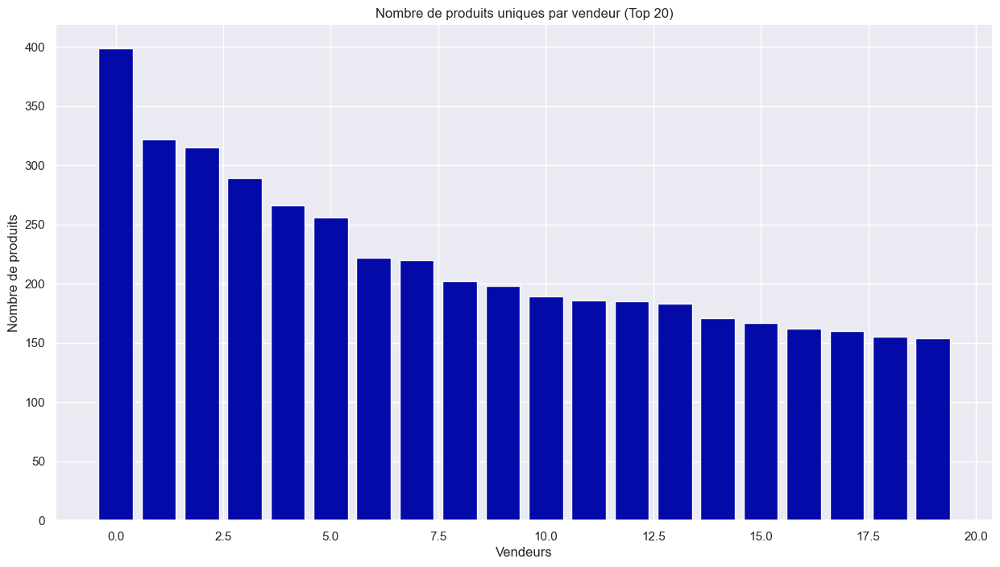

In [251]:
plt.figure(figsize=(15, 8))

produits_vendeur = achats.groupby('seller_id')['product_id'].nunique().sort_values(ascending=False)[:20]

plt.bar(range(len(produits_vendeur)), produits_vendeur.values, color=palette[0])
plt.title("Nombre de produits uniques par vendeur (Top 20)")
plt.xlabel("Vendeurs")
plt.ylabel("Nombre de produits")
plt.show()

### 8. Performance des nouveaux vs anciens vendeurs

<Figure size 1500x800 with 0 Axes>

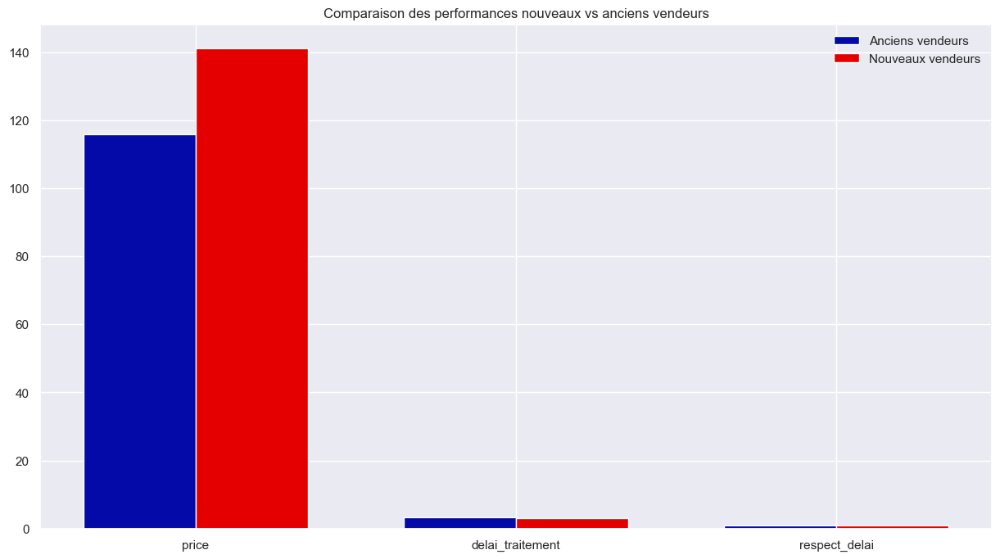

In [252]:
plt.figure(figsize=(15, 8))

premiere_vente = achats.groupby('seller_id')['purchase_timestamp'].min()
mediane_date = premiere_vente.median()

achats['vendeur_nouveau'] = achats['seller_id'].map(lambda x: 
    'Nouveau vendeur' if premiere_vente[x] > mediane_date else 'Ancien vendeur')

performance = achats.groupby('vendeur_nouveau').agg({
    'price': 'mean',
    'delai_traitement': 'mean',
    'respect_delai': 'mean'
})

x = np.arange(len(performance.columns))
width = 0.35

fig, ax = plt.subplots(figsize=(15, 8))
ax.bar(x - width/2, performance.iloc[0], width, label='Anciens vendeurs', color=palette[0])
ax.bar(x + width/2, performance.iloc[1], width, label='Nouveaux vendeurs', color=palette[1])

plt.title("Comparaison des performances nouveaux vs anciens vendeurs")
plt.xticks(x, performance.columns)
plt.legend()
plt.show()

### 9. Corrélation entre le volume de ventes et la performance

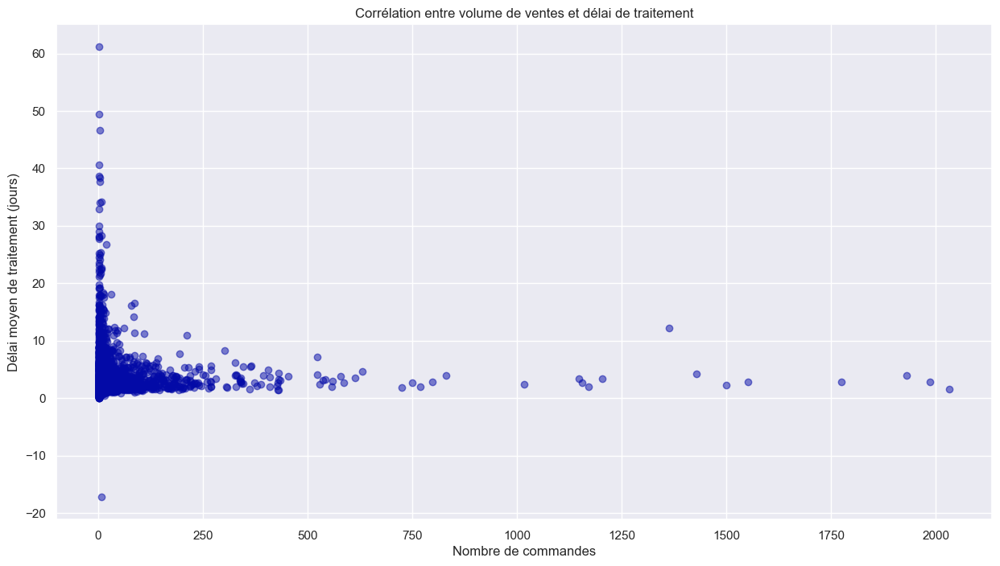

In [253]:
plt.figure(figsize=(15, 8))

performance_vendeurs = achats.groupby('seller_id').agg({
    'order_id': 'count',
    'delai_traitement': 'mean',
}).reset_index()

plt.scatter(performance_vendeurs['order_id'], 
           performance_vendeurs['delai_traitement'], 
           alpha=0.5, 
           color=palette[0])
plt.title("Corrélation entre volume de ventes et délai de traitement")
plt.xlabel("Nombre de commandes")
plt.ylabel("Délai moyen de traitement (jours)")
plt.show()

### 10. Taux de croissance des vendeurs dans le temps

<Figure size 1500x800 with 0 Axes>

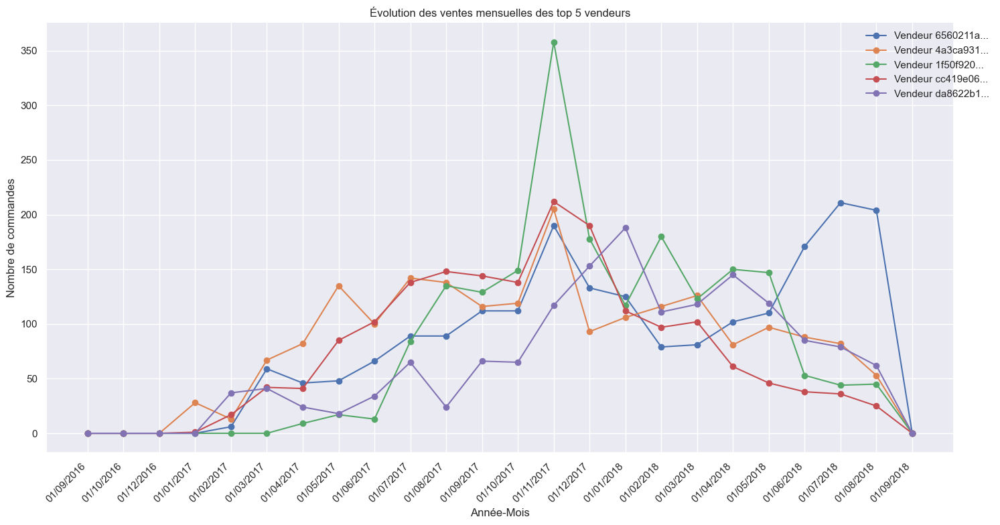

In [254]:
plt.figure(figsize=(15, 8))

ventes_mensuelles = achats.groupby(['seller_id', 'annee_mois'])['order_id'].count().reset_index()

top_sellers = achats.groupby('seller_id')['order_id'].count().nlargest(5).index

all_months = sorted(ventes_mensuelles['annee_mois'].unique())

plt.figure(figsize=(15, 8))

for seller in top_sellers:
    seller_data = ventes_mensuelles[ventes_mensuelles['seller_id'] == seller]
    plt.plot(range(len(all_months)), 
             [seller_data[seller_data['annee_mois'] == month]['order_id'].iloc[0] 
              if not seller_data[seller_data['annee_mois'] == month].empty else 0 
              for month in all_months],
             marker='o', 
             label=f'Vendeur {seller[:8]}...')

plt.title("Évolution des ventes mensuelles des top 5 vendeurs")
plt.xlabel("Année-Mois")
plt.ylabel("Nombre de commandes")

plt.xticks(range(len(all_months)), 
          [format_date(x) for x in all_months], 
          rotation=45, 
          ha='right')

plt.legend(bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

## Optimisation des coûts

### 1. Analyse des frais de port par rapport au prix des produits

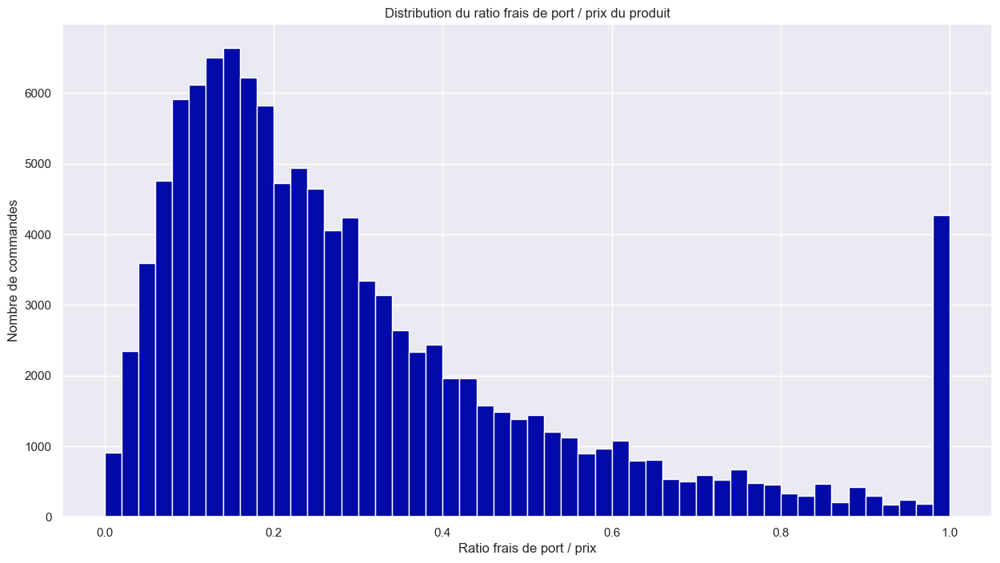

In [255]:
plt.figure(figsize=(15, 8))

achats['ratio_frais'] = achats['freight_value'] / achats['price']

plt.hist(achats['ratio_frais'].clip(0, 1), bins=50, color=palette[0])
plt.title("Distribution du ratio frais de port / prix du produit")
plt.xlabel("Ratio frais de port / prix")
plt.ylabel("Nombre de commandes")
plt.show()

### 2. Impact du poids et des dimensions sur les frais de livraison

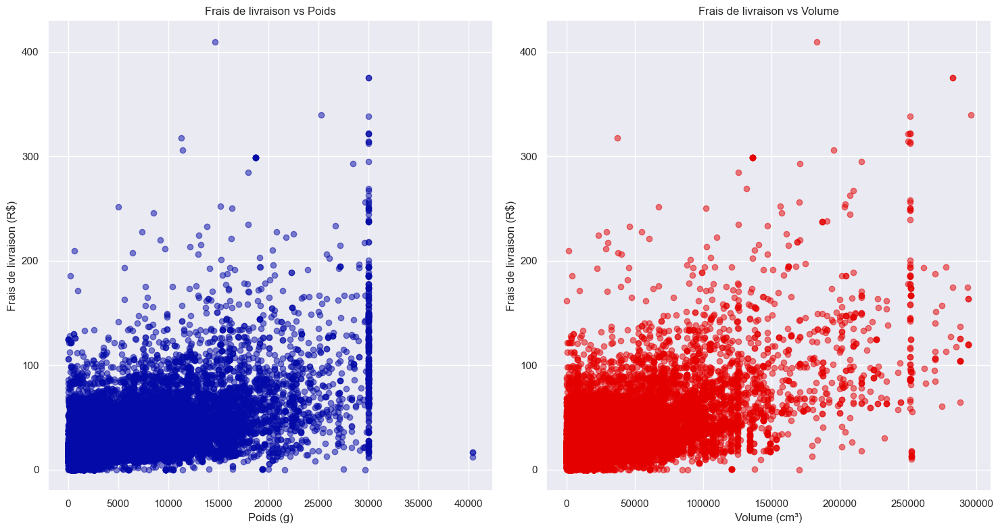

In [256]:
plt.figure(figsize=(15, 8))

achats['volume'] = achats['length_cm'] * achats['height_cm'] * achats['width_cm']

plt.subplot(1, 2, 1)
plt.scatter(achats['weight_g'], achats['freight_value'], alpha=0.5, color=palette[0])
plt.title("Frais de livraison vs Poids")
plt.xlabel("Poids (g)")
plt.ylabel("Frais de livraison (R$)")

plt.subplot(1, 2, 2)
plt.scatter(achats['volume'], achats['freight_value'], alpha=0.5, color=palette[1])
plt.title("Frais de livraison vs Volume")
plt.xlabel("Volume (cm³)")
plt.ylabel("Frais de livraison (R$)")

plt.tight_layout()
plt.show()

### 3. Coût moyen de livraison par région

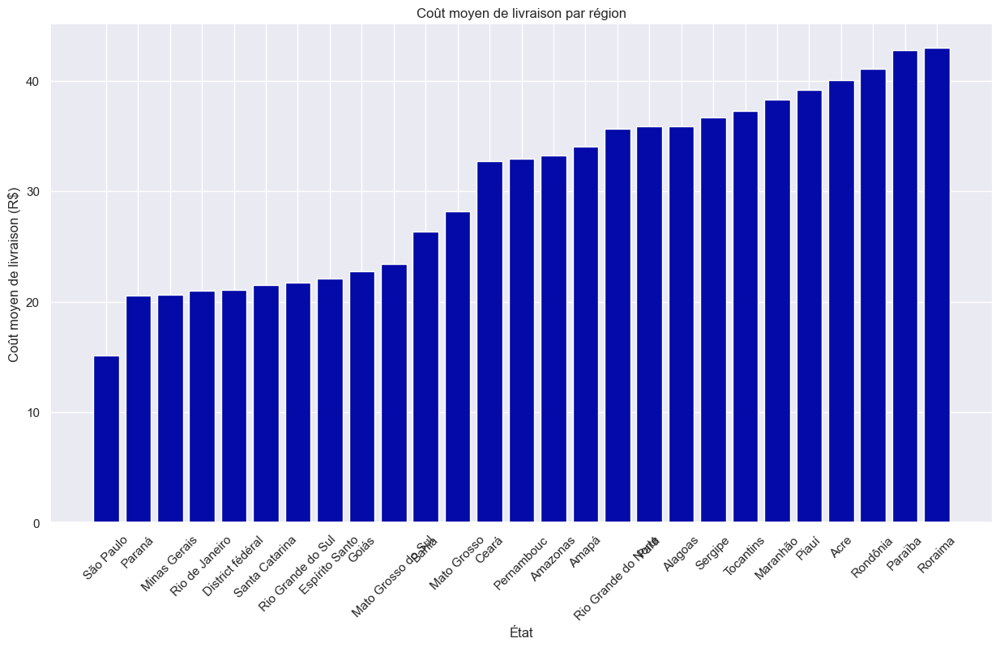

In [257]:
plt.figure(figsize=(15, 8))

cout_region = achats.groupby('cust_name_state')['freight_value'].mean().sort_values()

plt.bar(cout_region.index, cout_region.values, color=palette[0])
plt.title("Coût moyen de livraison par région")
plt.xlabel("État")
plt.ylabel("Coût moyen de livraison (R$)")
plt.xticks(rotation=45)
plt.show()

### 4. Rapport prix/poids des produits par catégorie

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


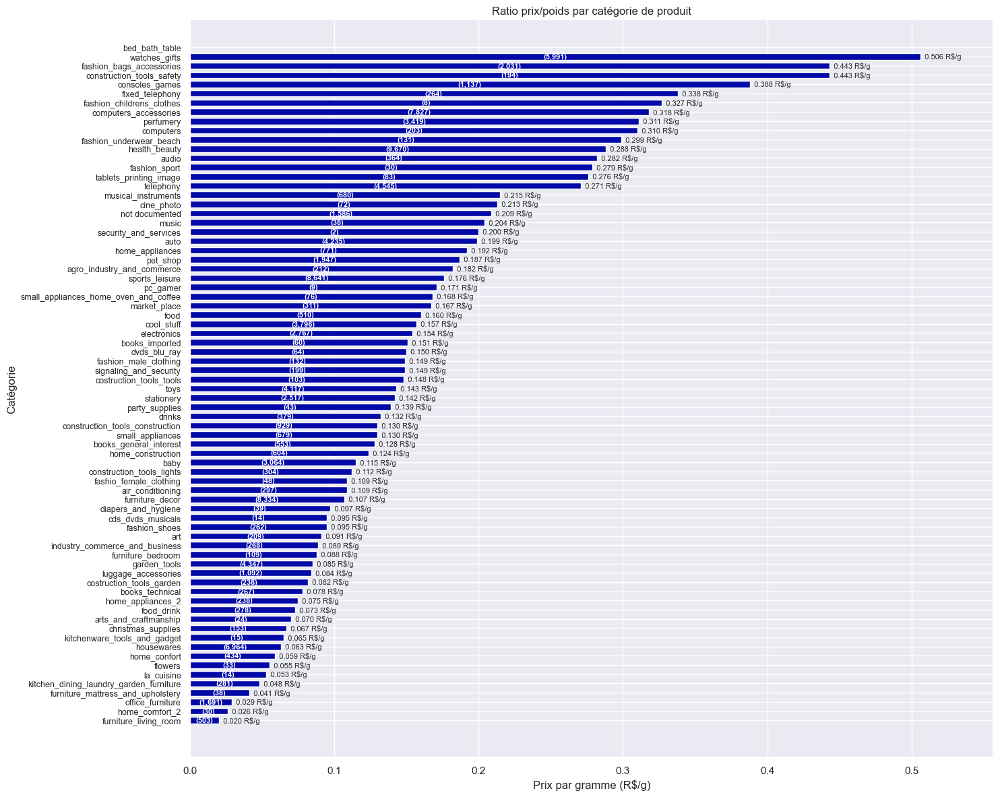

In [258]:
plt.figure(figsize=(15, 12))

achats['price_per_weight'] = achats['price'] / achats['weight_g']

stats_categorie = achats.groupby('category_name').agg({
    'price_per_weight': ['mean', 'count']
}).round(3)

ratio_categorie = stats_categorie[('price_per_weight', 'mean')].sort_values()

bars = plt.barh(range(len(ratio_categorie)), 
                ratio_categorie.values, 
                color=palette[0],
                height=0.7)

for i, v in enumerate(ratio_categorie.values):
    count = stats_categorie[('price_per_weight', 'count')][ratio_categorie.index[i]]
    plt.text(v, i, f'  {v:.3f} R$/g', 
             va='center', ha='left', fontsize=8)
    plt.text(v/2, i, f'({count:,})', 
             va='center', ha='center', 
             color='white', fontweight='bold', fontsize=8)

plt.title("Ratio prix/poids par catégorie de produit")
plt.xlabel("Prix par gramme (R$/g)")
plt.ylabel("Catégorie")

plt.yticks(range(len(ratio_categorie)), 
           ratio_categorie.index,
           fontsize=9)

plt.margins(x=0.1)
plt.tight_layout()
plt.show()

### 5. Identification des zones avec les coûts de livraison les plus élevés

In [259]:
import plotly.express as px
import plotly.graph_objects as go

couts_zones = achats.groupby('cust_name_state').agg({
    'freight_value': ['mean', 'sum', 'count']
}).reset_index()

fig = go.Figure(data=[go.Scatter3d(
    x=couts_zones[('freight_value', 'count')],
    y=couts_zones[('freight_value', 'mean')],
    z=couts_zones[('freight_value', 'sum')],
    mode='markers+text',
    text=couts_zones['cust_name_state'],
    marker=dict(
        size=8,
        color=couts_zones[('freight_value', 'sum')],
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title="Coût total de livraison (R$)")
    ),
    hovertemplate="État: %{text}<br>" +
                  "Nombre de commandes: %{x:,.0f}<br>" +
                  "Coût moyen: %{y:.2f} R$<br>" +
                  "Coût total: %{z:,.2f} R$<br>"
)])

fig.update_layout(
    title="Analyse 3D des coûts de livraison par état",
    scene=dict(
        xaxis_title="Nombre de commandes",
        yaxis_title="Coût moyen de livraison (R$)",
        zaxis_title="Coût total de livraison (R$)"
    ),
    width=1000,
    height=800
)

fig.show()

### 6. Analyse des marges par catégorie de produit

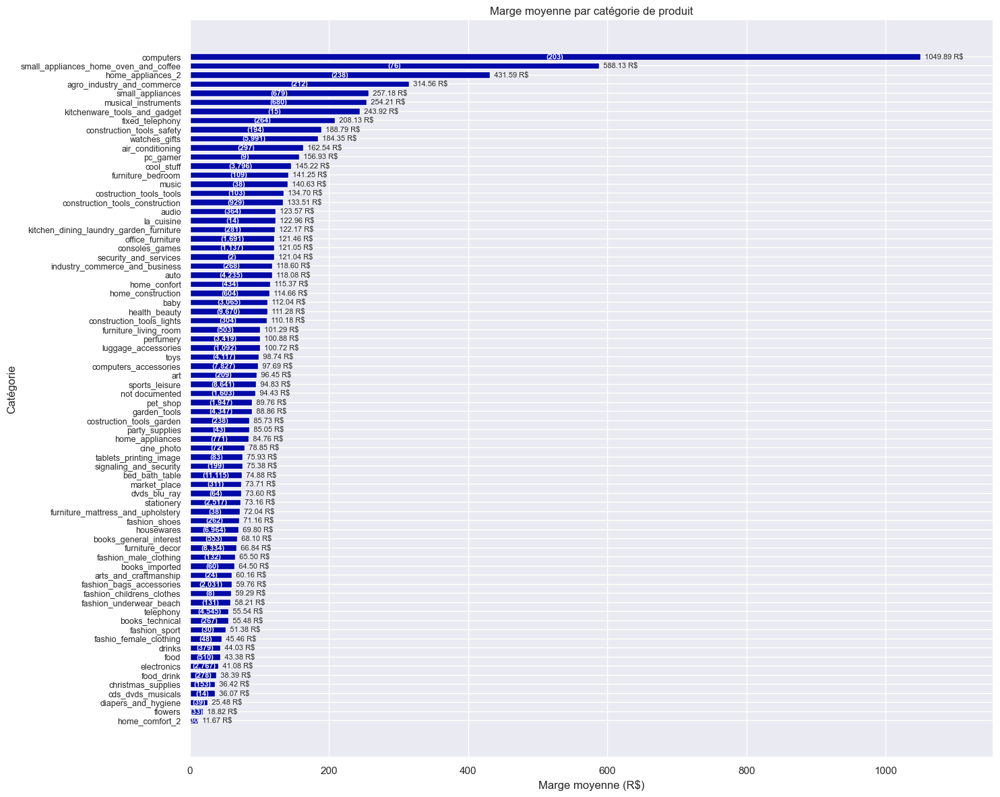

In [260]:
plt.figure(figsize=(15, 12))

achats['marge'] = achats['price'] - achats['freight_value']

stats_marge = achats.groupby('category_name').agg({
    'marge': ['mean', 'count']
}).round(2)

marge_categorie = stats_marge[('marge', 'mean')].sort_values()

bars = plt.barh(range(len(marge_categorie)), 
                marge_categorie.values, 
                color=palette[0],
                height=0.7)

for i, v in enumerate(marge_categorie.values):
    count = stats_marge[('marge', 'count')][marge_categorie.index[i]]
    plt.text(v, i, f'  {v:.2f} R$', 
             va='center', ha='left', fontsize=8)
    plt.text(v/2, i, f'({count:,})', 
             va='center', ha='center', 
             color='white', fontweight='bold', fontsize=8)

plt.title("Marge moyenne par catégorie de produit")
plt.xlabel("Marge moyenne (R$)")
plt.ylabel("Catégorie")

plt.yticks(range(len(marge_categorie)), 
           marge_categorie.index,
           fontsize=9)

plt.margins(x=0.1)
plt.tight_layout()
plt.show()

### 7. Impact des promotions sur les marges

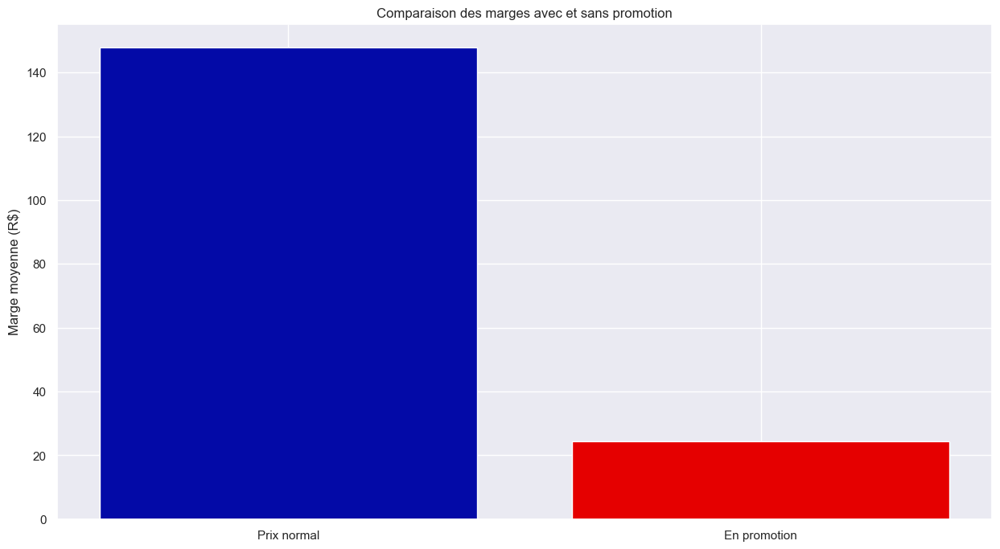

In [261]:
plt.figure(figsize=(15, 8))

prix_median = achats.groupby('category_name')['price'].transform('median')
achats['en_promotion'] = achats['price'] < prix_median * 0.8

marges_promo = achats.groupby('en_promotion')['marge'].mean()

plt.bar(['Prix normal', 'En promotion'], marges_promo.values, color=[palette[0], palette[1]])
plt.title("Comparaison des marges avec et sans promotion")
plt.ylabel("Marge moyenne (R$)")
plt.show()

### 8. Optimisation des coûts de livraison par zone

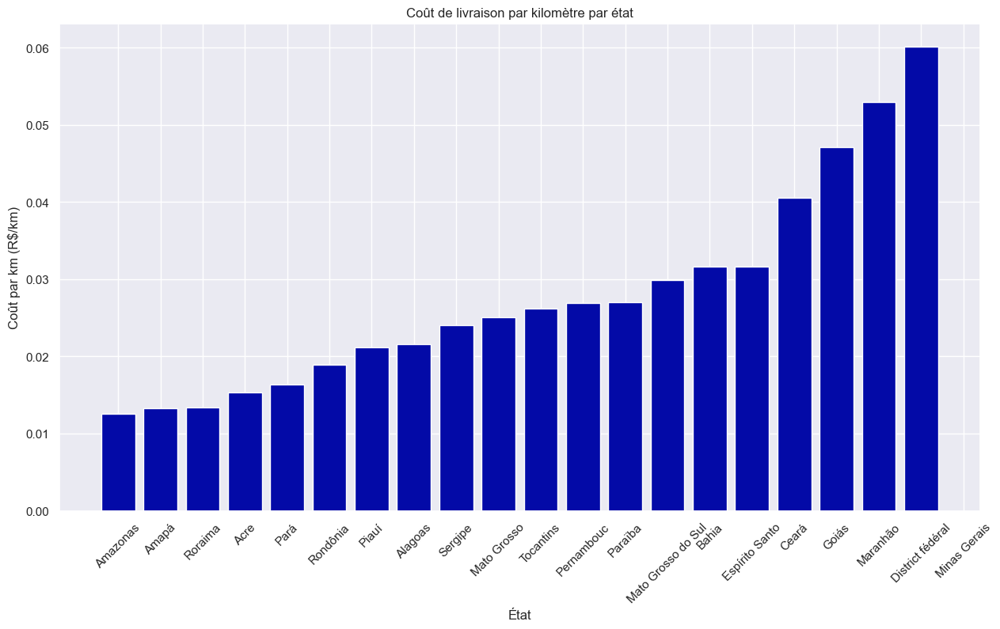

In [262]:
plt.figure(figsize=(15, 8))

achats['cout_par_km'] = achats['freight_value'] / achats['distance']
cout_km_state = achats.groupby('cust_name_state')['cout_par_km'].mean().sort_values()

plt.bar(cout_km_state.index, cout_km_state.values, color=palette[0])
plt.title("Coût de livraison par kilomètre par état")
plt.xlabel("État")
plt.ylabel("Coût par km (R$/km)")
plt.xticks(rotation=45)
plt.show()

### 9. Analyse 3D des coûts de livraison

In [263]:
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats

slope, intercept, r_value, p_value, std_err = stats.linregress(
    achats['distance'], achats['freight_value']
)

fig = go.Figure(data=[go.Scatter3d(
    x=achats['distance'],
    y=achats['price'],
    z=achats['freight_value'],
    mode='markers',
    marker=dict(
        size=5,
        color=achats['freight_value'],
        colorscale='Viridis',
        opacity=0.6,
        colorbar=dict(title="Frais de livraison (R$)")
    ),
    hovertemplate="Distance: %{x:.1f} km<br>" +
                  "Prix: %{y:.2f} R$<br>" +
                  "Frais de livraison: %{z:.2f} R$<br>"
)])

fig.update_layout(
    title="Analyse 3D des coûts de livraison",
    scene=dict(
        xaxis_title="Distance (km)",
        yaxis_title="Prix du produit (R$)",
        zaxis_title="Frais de livraison (R$)"
    ),
    width=1000,
    height=800,
    scene_camera=dict(
        eye=dict(x=1.5, y=1.5, z=1.5)
    )
)

x_range = np.linspace(achats['distance'].min(), achats['distance'].max(), 10)
y_range = np.linspace(achats['price'].min(), achats['price'].max(), 10)
X, Y = np.meshgrid(x_range, y_range)
Z = intercept + slope * X

fig.add_trace(go.Surface(
    x=X, y=Y, z=Z,
    name='Plan de régression',
    showscale=False,
    opacity=0.3
))

fig.show()

### 10. ROI des différentes stratégies de livraison

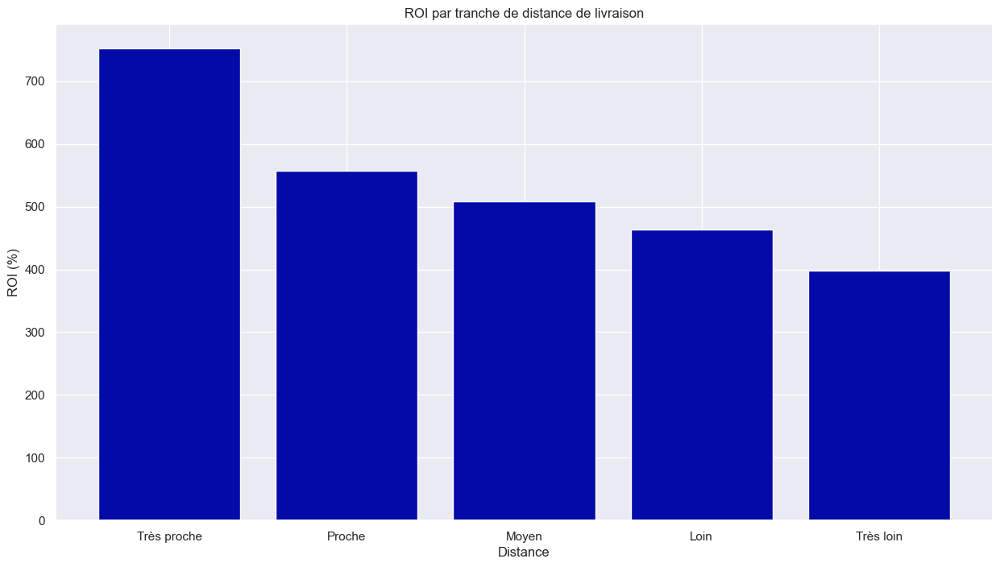

In [264]:
plt.figure(figsize=(15, 8))

achats['distance_bin'] = pd.qcut(achats['distance'], 5, labels=['Très proche', 'Proche', 
                                                               'Moyen', 'Loin', 'Très loin'])
roi_distance = achats.groupby('distance_bin').agg({
    'marge': 'mean',
    'freight_value': 'mean',
    'price': 'mean'
}).reset_index()

roi_distance['roi'] = (roi_distance['marge'] / roi_distance['freight_value']) * 100

plt.bar(roi_distance['distance_bin'], roi_distance['roi'], color=palette[0])
plt.title("ROI par tranche de distance de livraison")
plt.xlabel("Distance")
plt.ylabel("ROI (%)")
plt.show()

## Qualité des approvisionnements

### 1. Analyse des caractéristiques produits par catégorie

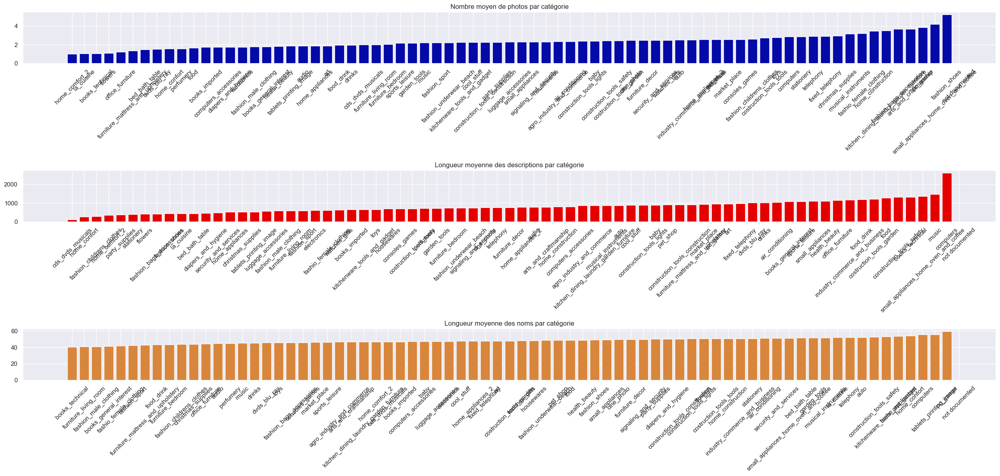

In [265]:
# 1. Analyse des caractéristiques produits par catégorie
plt.figure(figsize=(25, 12))

# Créer plusieurs sous-graphiques pour différentes caractéristiques
plt.subplot(3, 1, 1)
photos_cat = achats.groupby('category_name')['photos_qty'].mean().sort_values()
plt.bar(photos_cat.index, photos_cat.values, color=palette[0])
plt.title("Nombre moyen de photos par catégorie")
plt.xticks(rotation=45)

plt.subplot(3, 1, 2)
desc_cat = achats.groupby('category_name')['description_lenght'].mean().sort_values()
plt.bar(desc_cat.index, desc_cat.values, color=palette[1])
plt.title("Longueur moyenne des descriptions par catégorie")
plt.xticks(rotation=45)

plt.subplot(3, 1, 3)
name_cat = achats.groupby('category_name')['name_lenght'].mean().sort_values()
plt.bar(name_cat.index, name_cat.values, color=palette[2])
plt.title("Longueur moyenne des noms par catégorie")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### 2. Corrélation entre la qualité des fiches produits et les ventes

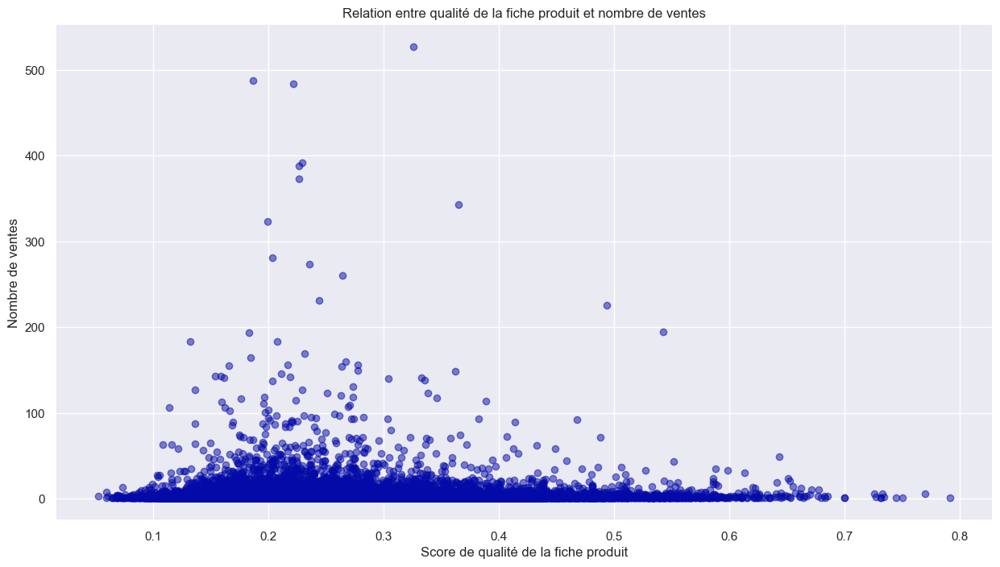

In [266]:
plt.figure(figsize=(15, 8))

achats['fiche_score'] = (
    (achats['photos_qty'] / achats['photos_qty'].max()) * 0.4 +
    (achats['description_lenght'] / achats['description_lenght'].max()) * 0.4 +
    (achats['name_lenght'] / achats['name_lenght'].max()) * 0.2
)

qualite_ventes = achats.groupby('product_id').agg({
    'fiche_score': 'first',
    'order_id': 'count'
}).reset_index()

plt.scatter(qualite_ventes['fiche_score'], qualite_ventes['order_id'], 
           alpha=0.5, color=palette[0])
plt.title("Relation entre qualité de la fiche produit et nombre de ventes")
plt.xlabel("Score de qualité de la fiche produit")
plt.ylabel("Nombre de ventes")
plt.show()

### 3. Taux de disponibilité des produits par vendeur

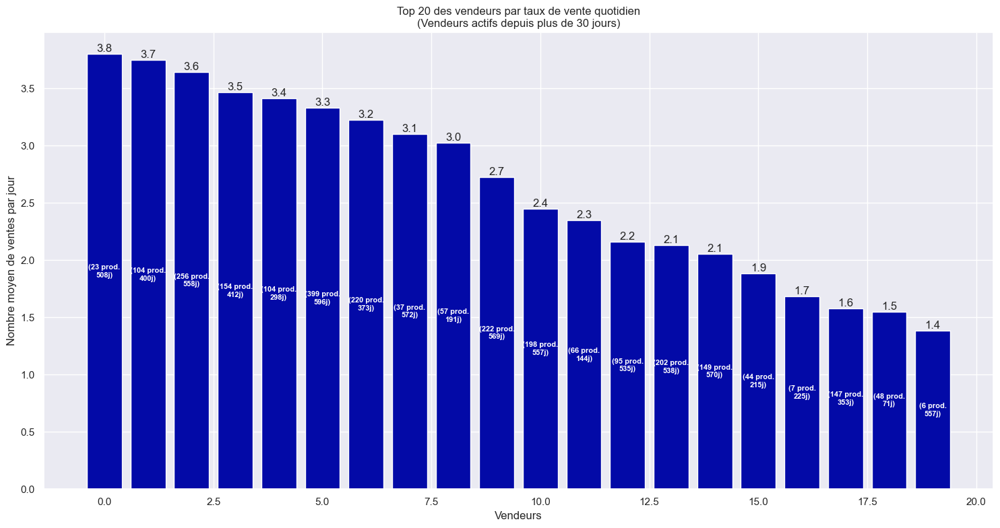


Statistiques des top 5 vendeurs:

Vendeur 1f50f920...
Ventes par jour: 3.80
Produits uniques: 23
Période d'activité: 508 jours
Total des ventes: 1931

Vendeur 955fee92...
Ventes par jour: 3.75
Produits uniques: 104
Période d'activité: 400 jours
Total des ventes: 1499

Vendeur 6560211a...
Ventes par jour: 3.64
Produits uniques: 256
Période d'activité: 558 jours
Total des ventes: 2033

Vendeur 1025f0e2...
Ventes par jour: 3.47
Produits uniques: 154
Période d'activité: 412 jours
Total des ventes: 1428

Vendeur 8b321bb6...
Ventes par jour: 3.42
Produits uniques: 104
Période d'activité: 298 jours
Total des ventes: 1018


In [267]:
plt.figure(figsize=(15, 8))

vendeur_stats = achats.groupby('seller_id').agg({
    'purchase_timestamp': lambda x: (x.max() - x.min()).days,
    'product_id': 'nunique',  
    'order_id': 'count'      
}).reset_index()

vendeur_stats['produits_par_jour'] = vendeur_stats['product_id'] / vendeur_stats['purchase_timestamp']
vendeur_stats['ventes_par_jour'] = vendeur_stats['order_id'] / vendeur_stats['purchase_timestamp']

vendeur_stats = vendeur_stats[vendeur_stats['purchase_timestamp'] >= 30]

top_vendeurs = vendeur_stats.nlargest(20, 'ventes_par_jour')

bars = plt.bar(range(len(top_vendeurs)), 
               top_vendeurs['ventes_par_jour'], 
               color=palette[0])

for i, row in enumerate(top_vendeurs.itertuples()):
    plt.text(i, row.ventes_par_jour, 
             f'{row.ventes_par_jour:.1f}', 
             ha='center', va='bottom')
    plt.text(i, row.ventes_par_jour/2, 
             f'({row.product_id} prod.\n{row.purchase_timestamp}j)', 
             ha='center', va='center', 
             color='white', fontweight='bold', 
             fontsize=8)

plt.title("Top 20 des vendeurs par taux de vente quotidien\n(Vendeurs actifs depuis plus de 30 jours)")
plt.xlabel("Vendeurs")
plt.ylabel("Nombre moyen de ventes par jour")

plt.tight_layout()
plt.show()

print("\nStatistiques des top 5 vendeurs:")
for i, row in top_vendeurs.head().iterrows():
    print(f"\nVendeur {row['seller_id'][:8]}...")
    print(f"Ventes par jour: {row['ventes_par_jour']:.2f}")
    print(f"Produits uniques: {row['product_id']}")
    print(f"Période d'activité: {row['purchase_timestamp']} jours")
    print(f"Total des ventes: {row['order_id']}")

### 4. Performance des catégories de produits

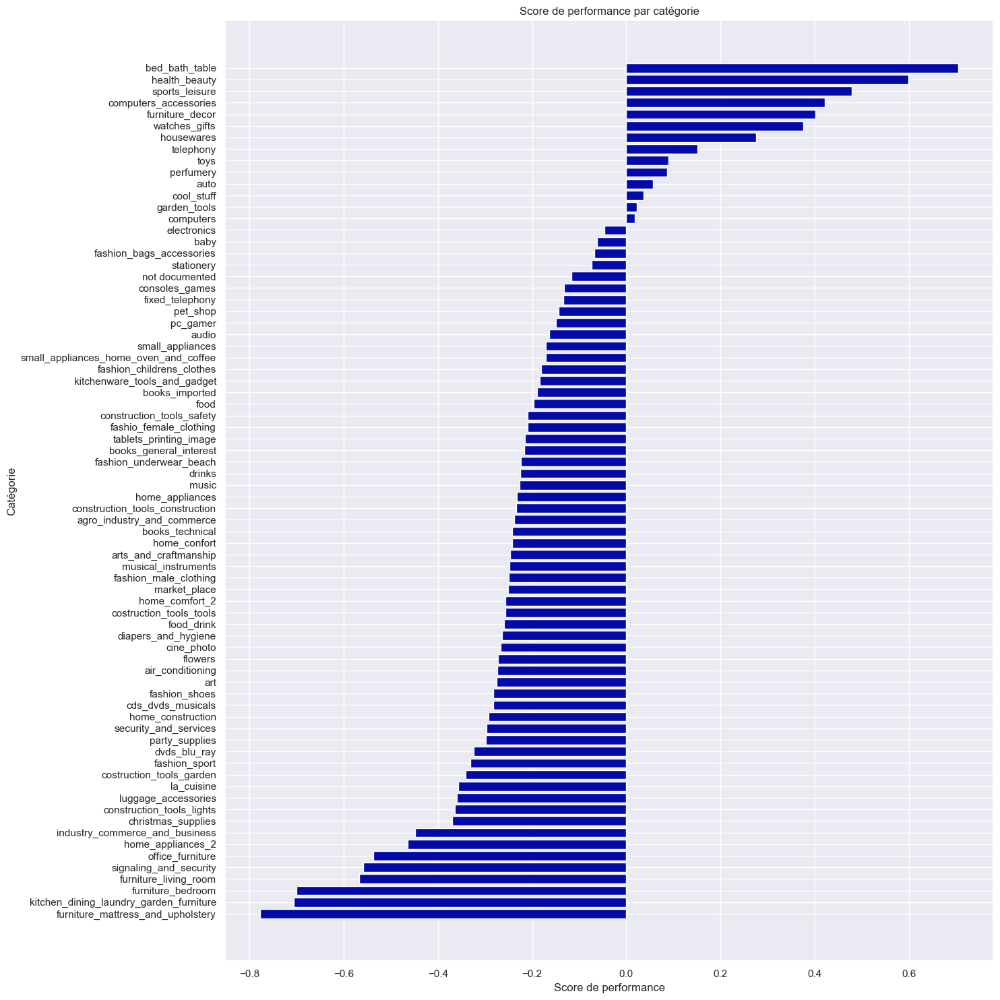

In [268]:
plt.figure(figsize=(15, 15))

performance_cat = achats.groupby('category_name').agg({
    'price': 'mean',
    'order_id': 'count',
    'freight_value': 'mean'
}).reset_index()

performance_cat['score'] = (
    (performance_cat['price'] / performance_cat['price'].max()) +
    (performance_cat['order_id'] / performance_cat['order_id'].max()) -
    (performance_cat['freight_value'] / performance_cat['freight_value'].max())
)

performance_cat = performance_cat.sort_values('score', ascending=True)

plt.barh(performance_cat['category_name'], performance_cat['score'], color=palette[0])
plt.title("Score de performance par catégorie")
plt.xlabel("Score de performance")
plt.ylabel("Catégorie")
plt.tight_layout()
plt.show()

### 5. Analyse des volumes de vente par caractéristiques produit

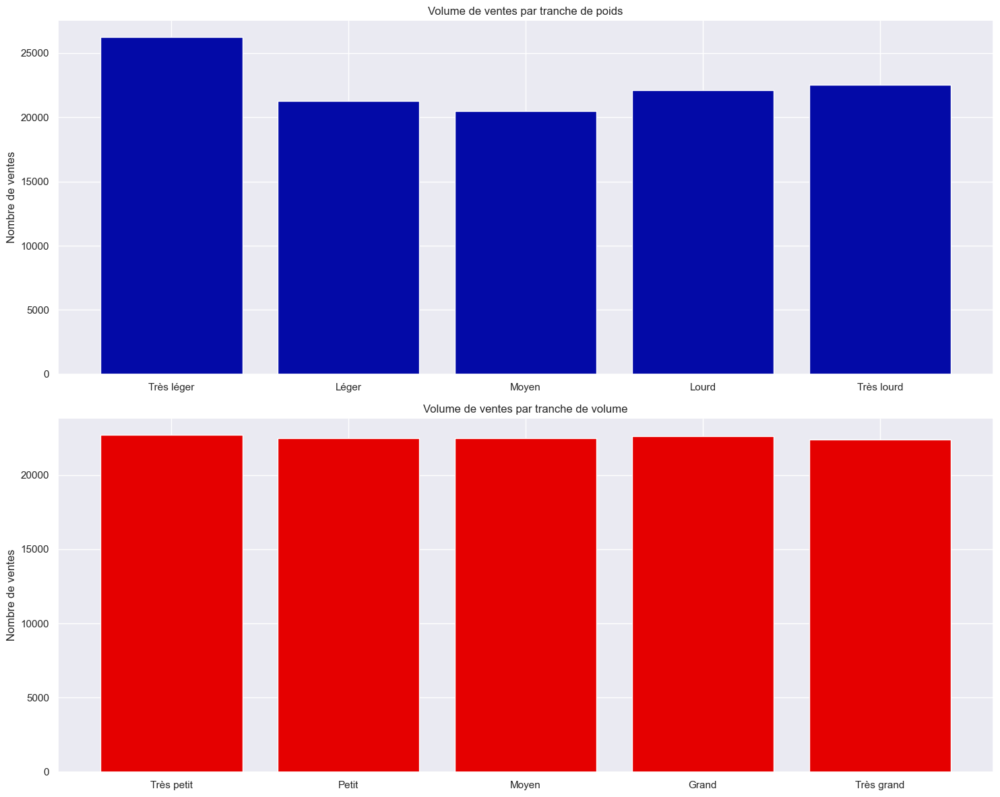

In [269]:
plt.figure(figsize=(15, 12))

achats['weight_bin'] = pd.qcut(achats['weight_g'], 5, labels=['Très léger', 'Léger', 
                                                             'Moyen', 'Lourd', 'Très lourd'])
achats['volume_bin'] = pd.qcut(achats['volume'], 5, labels=['Très petit', 'Petit', 
                                                           'Moyen', 'Grand', 'Très grand'])

plt.subplot(2, 1, 1)
weight_sales = achats.groupby('weight_bin').size()
plt.bar(weight_sales.index, weight_sales.values, color=palette[0])
plt.title("Volume de ventes par tranche de poids")
plt.ylabel("Nombre de ventes")

plt.subplot(2, 1, 2)
volume_sales = achats.groupby('volume_bin').size()
plt.bar(volume_sales.index, volume_sales.values, color=palette[1])
plt.title("Volume de ventes par tranche de volume")
plt.ylabel("Nombre de ventes")

plt.tight_layout()
plt.show()

### 6. Impact du nombre de photos sur les ventes

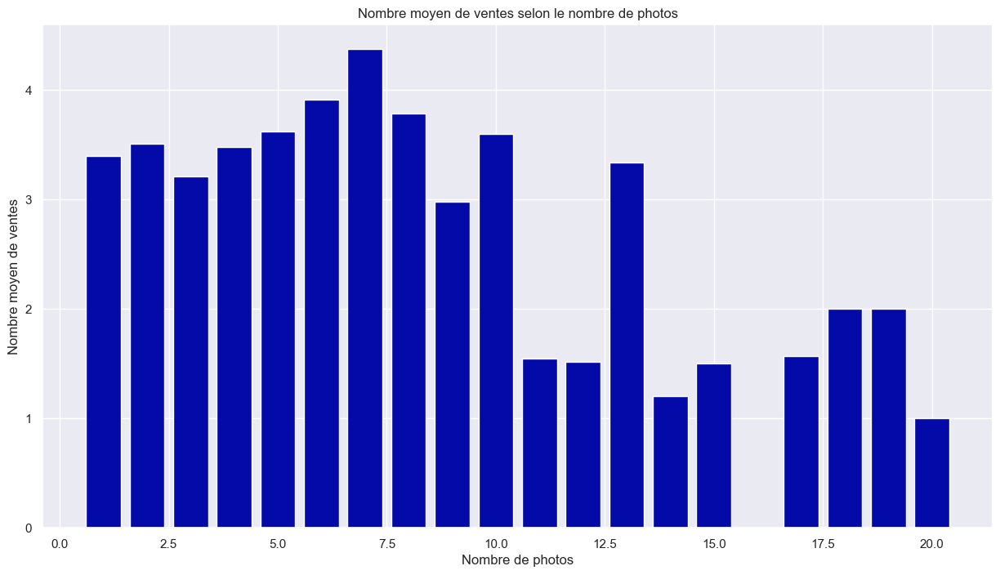

In [270]:
plt.figure(figsize=(15, 8))

ventes_photos = achats.groupby(['product_id', 'photos_qty']).size().reset_index(name='ventes')
ventes_photos_moy = ventes_photos.groupby('photos_qty')['ventes'].mean()

plt.bar(ventes_photos_moy.index, ventes_photos_moy.values, color=palette[0])
plt.title("Nombre moyen de ventes selon le nombre de photos")
plt.xlabel("Nombre de photos")
plt.ylabel("Nombre moyen de ventes")
plt.show()

### 7. Qualité des descriptions produit et conversion

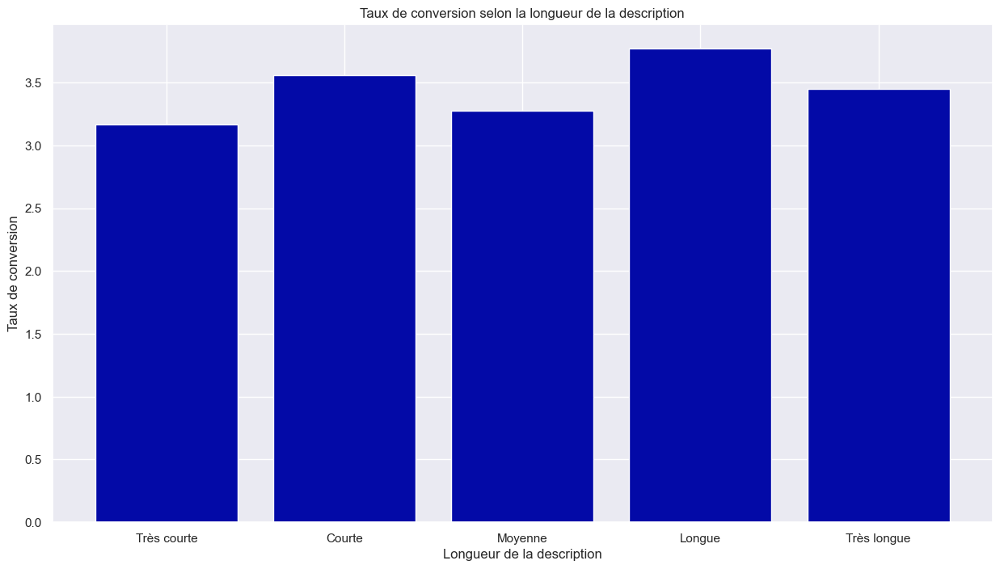

In [271]:
plt.figure(figsize=(15, 8))

achats['desc_bin'] = pd.qcut(achats['description_lenght'], 5, 
                            labels=['Très courte', 'Courte', 'Moyenne', 'Longue', 'Très longue'])

conversion_desc = achats.groupby('desc_bin').agg({
    'order_id': 'count',
    'product_id': 'nunique'
})
conversion_desc['taux_conversion'] = conversion_desc['order_id'] / conversion_desc['product_id']

plt.bar(conversion_desc.index, conversion_desc['taux_conversion'], color=palette[0])
plt.title("Taux de conversion selon la longueur de la description")
plt.xlabel("Longueur de la description")
plt.ylabel("Taux de conversion")
plt.show()

### 8. Taux de rotation des stocks par catégorie

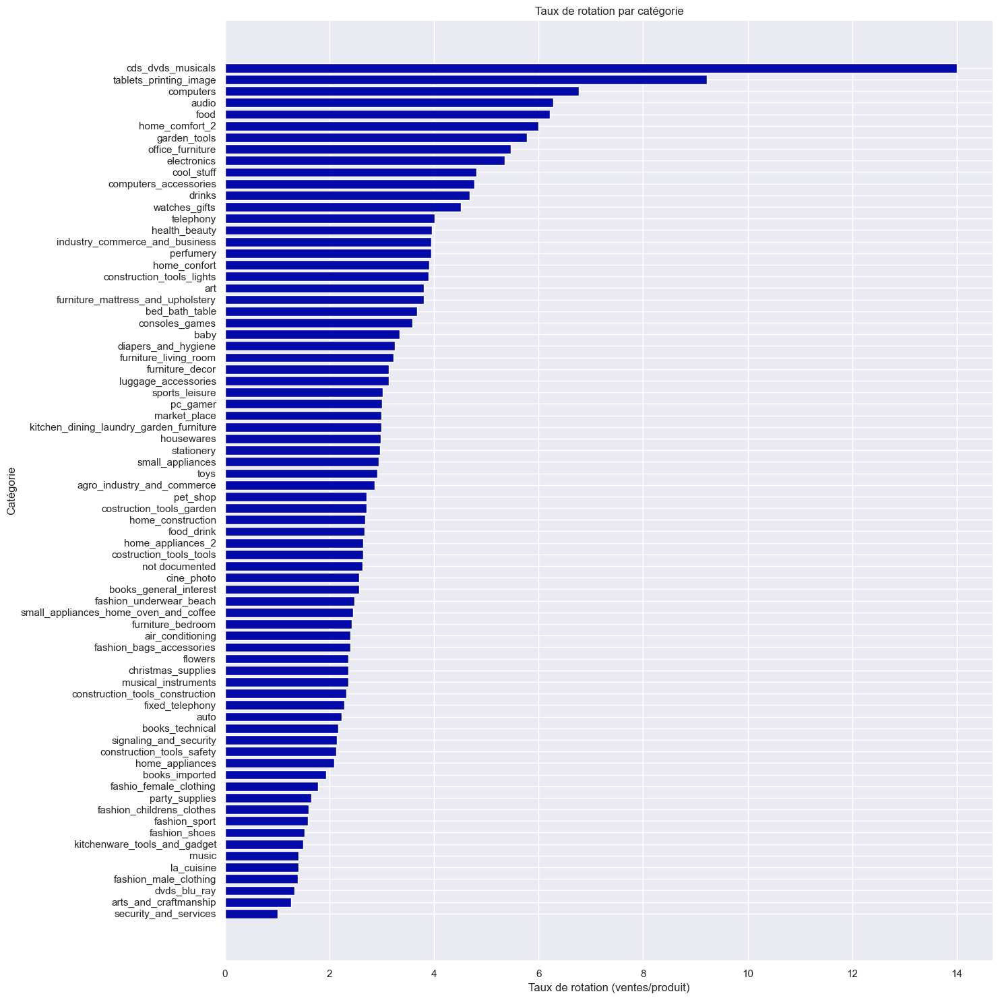

In [272]:
plt.figure(figsize=(15, 15))

rotation = achats.groupby('category_name').agg({
    'order_id': 'count',
    'product_id': 'nunique'
})
rotation['taux_rotation'] = rotation['order_id'] / rotation['product_id']
rotation = rotation.sort_values('taux_rotation', ascending=True)

plt.barh(rotation.index, rotation['taux_rotation'], color=palette[0])
plt.title("Taux de rotation par catégorie")
plt.xlabel("Taux de rotation (ventes/produit)")
plt.ylabel("Catégorie")
plt.tight_layout()
plt.show()

### 9. Analyse des ruptures de stock

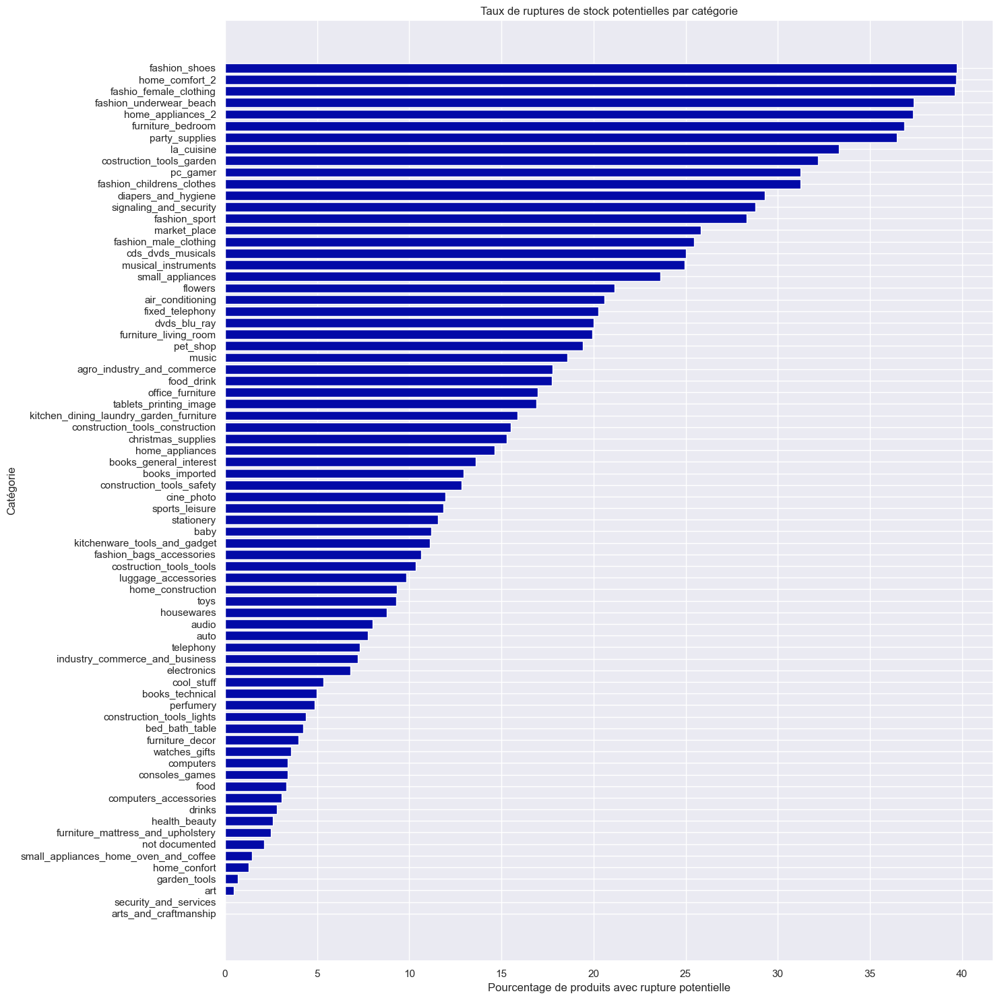

In [273]:
plt.figure(figsize=(15, 15))

ventes_produit = achats.groupby(['product_id', 'purchase_timestamp']).size().reset_index(name='ventes')
ventes_produit['ecart_ventes'] = ventes_produit.groupby('product_id')['purchase_timestamp'].diff()
ventes_produit['possible_rupture'] = ventes_produit['ecart_ventes'] > pd.Timedelta(days=30)

ruptures_cat = achats.merge(ventes_produit[['product_id', 'possible_rupture']], 
                           on='product_id')\
                     .groupby('category_name')['possible_rupture'].mean()
ruptures_cat = ruptures_cat.sort_values(ascending=True)

plt.barh(ruptures_cat.index, ruptures_cat.values * 100, color=palette[0])
plt.title("Taux de ruptures de stock potentielles par catégorie")
plt.xlabel("Pourcentage de produits avec rupture potentielle")
plt.ylabel("Catégorie")
plt.tight_layout()
plt.show()

### 10. Impact des nouveaux produits sur les ventes

<Figure size 1500x800 with 0 Axes>

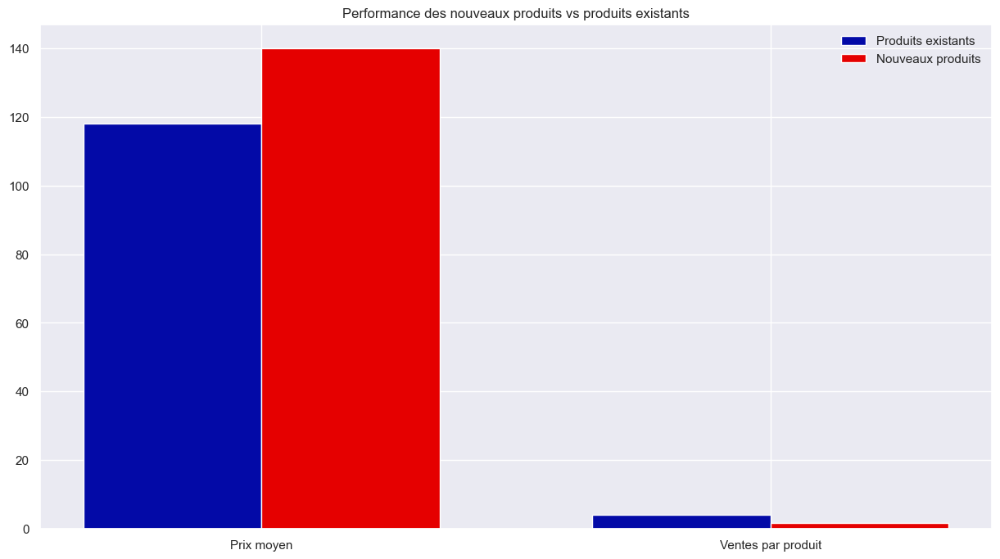

In [274]:
plt.figure(figsize=(15, 8))

premiere_vente = achats.groupby('product_id')['purchase_timestamp'].min()
seuil_nouveau = achats['purchase_timestamp'].quantile(0.75)
achats['nouveau_produit'] = achats['product_id'].map(lambda x: premiere_vente[x] > seuil_nouveau)

performance_nouveaute = achats.groupby('nouveau_produit').agg({
    'price': 'mean',
    'order_id': 'count',
    'product_id': 'nunique'
}).reset_index()
performance_nouveaute['ventes_par_produit'] = (
    performance_nouveaute['order_id'] / performance_nouveaute['product_id']
)

metrics = ['price', 'ventes_par_produit']
x = np.arange(len(metrics))
width = 0.35

fig, ax = plt.subplots(figsize=(15, 8))
ax.bar(x - width/2, performance_nouveaute.loc[0, metrics], width, 
       label='Produits existants', color=palette[0])
ax.bar(x + width/2, performance_nouveaute.loc[1, metrics], width, 
       label='Nouveaux produits', color=palette[1])

plt.title("Performance des nouveaux produits vs produits existants")
plt.xticks(x, ['Prix moyen', 'Ventes par produit'])
plt.legend()
plt.show()